# Telecom Churn Case Study                                       

## Objective of the case study:

1. To predict whether a high-value customer will churn or not, in near future. By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

2. To identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

## Inspecting the given dataset

In [1]:
# importing the necessary libraries
import numpy as np
import pandas as pd
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

#import the necessary libraries for EDA
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# creating a dataframe using pandas
telecom = pd.read_csv('telecom_churn_data.csv')

In [3]:
# getting the shape of the dataframe
print(telecom.shape)

#getting the info of the dataframe
print(telecom.info)

#getting the description of the dataframe
print(telecom.describe)

(99999, 226)
<bound method DataFrame.info of        mobile_number  circle_id  loc_og_t2o_mou  std_og_t2o_mou  \
0         7000842753        109             0.0             0.0   
1         7001865778        109             0.0             0.0   
2         7001625959        109             0.0             0.0   
3         7001204172        109             0.0             0.0   
4         7000142493        109             0.0             0.0   
...              ...        ...             ...             ...   
99994     7001548952        109             0.0             0.0   
99995     7000607688        109             0.0             0.0   
99996     7000087541        109             0.0             0.0   
99997     7000498689        109             0.0             0.0   
99998     7001905007        109             0.0             0.0   

       loc_ic_t2o_mou last_date_of_month_6 last_date_of_month_7  \
0                 0.0            6/30/2014            7/31/2014   
1               

### Observations:


1. There are totally 99999 rows and 226 columns in the dataset.
2. Most of the columns have int, float datatypes.

## Data understanding and cleaning:

In [4]:
# to display all the records in the dataset
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

# checking the dataset for missing values
print(round(telecom.isnull().sum()/len(telecom) * 100),2)

mobile_number                0.0
circle_id                    0.0
loc_og_t2o_mou               1.0
std_og_t2o_mou               1.0
loc_ic_t2o_mou               1.0
last_date_of_month_6         0.0
last_date_of_month_7         1.0
last_date_of_month_8         1.0
last_date_of_month_9         2.0
arpu_6                       0.0
arpu_7                       0.0
arpu_8                       0.0
arpu_9                       0.0
onnet_mou_6                  4.0
onnet_mou_7                  4.0
onnet_mou_8                  5.0
onnet_mou_9                  8.0
offnet_mou_6                 4.0
offnet_mou_7                 4.0
offnet_mou_8                 5.0
offnet_mou_9                 8.0
roam_ic_mou_6                4.0
roam_ic_mou_7                4.0
roam_ic_mou_8                5.0
roam_ic_mou_9                8.0
roam_og_mou_6                4.0
roam_og_mou_7                4.0
roam_og_mou_8                5.0
roam_og_mou_9                8.0
loc_og_t2t_mou_6             4.0
loc_og_t2t

### Observation:

1. It is observed that more columns have nearly more than 50% of the data missing. 
2. Lets drop the those columns directly from the dataset.

In [5]:
# dropping columns having more than 50% of the missing values
high_missing_vals = (telecom.isnull().sum()/len(telecom) * 100) > 50

high_missing_vals = high_missing_vals[high_missing_vals==True]

high_missing_vals.shape

(40,)

In [6]:
telecom.drop(columns=high_missing_vals.index, inplace=True)

In [7]:
telecom.shape

(99999, 186)

Nearly 40 columns where dropped due to high missing values. And the number of columns is 186 now.

In [8]:
telecom.isnull().sum()
# Creating a functiom to display the null values and number of unique values present in each columns of the dataframe
def get_details(df):
    return pd.DataFrame({
        'Count_of_Nulls': df.isnull().sum(), 
        'Percentage_of_Nulls' : round((df.isnull().sum()/len(df)*100), 2),
        'Count_of_uniques': df.nunique()
         })
get_details(telecom)

,Count_of_Nulls,Percentage_of_Nulls,Count_of_uniques
mobile_number,0,0.00,99999
circle_id,0,0.00,1
loc_og_t2o_mou,1018,1.02,1
std_og_t2o_mou,1018,1.02,1
loc_ic_t2o_mou,1018,1.02,1
last_date_of_month_6,0,0.00,1
last_date_of_month_7,601,0.60,1
last_date_of_month_8,1100,1.10,1
last_date_of_month_9,1659,1.66,1
arpu_6,0,0.00,85681


### Observations:

1. Now most of the columns have less than 10% of the missing values.
2. Since the mobile number has unique value equal to total number of rows, therefore there are no duplicate records present in the dataframe.

In [9]:
# Making mobile number as index for the dataframe as it indicates each individual customer
#telecom = telecom.set_index('mobile_number')

In [10]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0

### Since all the variales are named in a specific format (*description*_monthNumber) But aug_vbc_3g, jul_vbc_3g, jun_vbc_3g, sep_vbc_3g are named reverse. 
### So lets rename these four columns in order to follow the same pattern.


In [11]:
# Renaming aug_vbc_3g, jul_vbc_3g, jun_vbc_3g, sep_vbc_3g columns
telecom = telecom.rename({'aug_vbc_3g' : 'vbc_3g_8', 'jul_vbc_3g' : 'vbc_3g_7', 'jun_vbc_3g' : 'vbc_3g_6', 'sep_vbc_3g' : 'vbc_3g_9'}, axis=1)

In [12]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,0.0,0.0,0.0,4

### Converting the datatype of date columns from object to datetime

In [13]:
# importing regex
import re
date_cols = []
columns = telecom.columns
for col in columns:
    d_col = re.findall('.*date*.', col)
    if d_col:
        date_cols.append(col)
print(date_cols)

['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9']


In [14]:
#converting the datatype of above date cols from object to datetime
telecom[date_cols] = telecom[date_cols].apply(pd.to_datetime)

In [15]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,7000842753,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,

### Observations:

1. Since the last date of the month is of no significant use as of now, But lets keep the variable for future usage while doing any date subtraction operation.

In [16]:
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,7000842753,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.51,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.23,4.58,0.13,0.00,0.0,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.00,

### Before performing EDA on the dataframe lets first identify the high value customers from the good phase ie Jun, July

## Filtering High value customers:

High value customers are those whose total average recharge amount of june and july is greater than or equal to 70th percentile of Average recharge amount

In [17]:
telecom['avg_rech_amt_6n7'] = (telecom['total_rech_amt_6'] + telecom['total_rech_amt_7'])/2

#70th percentile of avg_rech_amt_6n7
percentile_70 = telecom['avg_rech_amt_6n7'].quantile(0.7)

print(percentile_70)

high_value_customers = telecom[telecom['avg_rech_amt_6n7'] >= percentile_70]

high_value_customers.shape

368.5


(30011, 187)

### Observation:

1. There are nearly  30011 high value customers in the dataset.

## Handling missing values

In [18]:
get_details(high_value_customers)

,Count_of_Nulls,Percentage_of_Nulls,Count_of_uniques
mobile_number,0,0.00,30011
circle_id,0,0.00,1
loc_og_t2o_mou,114,0.38,1
std_og_t2o_mou,114,0.38,1
loc_ic_t2o_mou,114,0.38,1
last_date_of_month_6,0,0.00,1
last_date_of_month_7,31,0.10,1
last_date_of_month_8,157,0.52,1
last_date_of_month_9,360,1.20,1
arpu_6,0,0.00,29261


In [19]:
print(high_value_customers['std_og_t2c_mou_6'].value_counts())
print(high_value_customers['loc_ic_t2o_mou'].value_counts())

std_og_t2c_mou_6
0.0    29695
Name: count, dtype: int64
loc_ic_t2o_mou
0.0    29897
Name: count, dtype: int64


### Observations:

1. Columns with 1 unique values can be removed from the dataframe.

In [20]:
# removing columns with 1 unique value
df = get_details(high_value_customers)
df = df[df['Count_of_uniques'] == 1]
single_value_cols = list(df.index)

high_value_customers.drop(columns=single_value_cols, inplace=True)

In [21]:
high_value_customers.shape

(30011, 171)

In [22]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,NaN,0.0,0.0,0.00,NaN,422.16,533.91,255.79,NaN,4.30,23.29,12.01,NaN,49.89,31.76,49.14,NaN,6.66,20.08,16.68,NaN,60.86,75.14,77.84,NaN,0.0,0.18,10.01,NaN,4.50,0.00,6.50,NaN,0.00,0.0,0.0,NaN,487.53,609.24,350.16,0.00,58.14,32.26,27.31,NaN,217.56,221.49,121.19,NaN,152.16,101.46,39.53,NaN,427.88,355.23,188.04,NaN,36.89,11.83,30.39,NaN,91.44,126.99,141.33,NaN,52.19,34.24,22.21,NaN,180.54,173.08,193.94,NaN,626.46,558.04,428.74,0.00,0.21,0.0,0.0,NaN,2.06,14.53,31.59,NaN,15.74,15.19,15.14,NaN,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.0,22.43,4.66,0.75,13.53,103.86,28.49,16.54,34.91,0.00,0.0,0.0

In [23]:
handling_missing_val = get_details(high_value_customers)[['Percentage_of_Nulls']].sort_values(by='Percentage_of_Nulls', ascending=False)

In [24]:
handling_missing_val

,Percentage_of_Nulls
std_og_t2f_mou_9,5.68
roam_ic_mou_9,5.68
loc_og_mou_9,5.68
loc_ic_t2t_mou_9,5.68
loc_og_t2f_mou_9,5.68
std_ic_t2m_mou_9,5.68
std_ic_mou_9,5.68
loc_og_t2m_mou_9,5.68
std_og_t2t_mou_9,5.68
spl_ic_mou_9,5.68


### Observation:

1. It is observed that most of the missing values are from september month ie churned phase. 
2. Therefore it means that, the missing values are excepted because the customers are already churned and the data is not available.
3. Lets look into month wise/phase wise analysis to get deep understanding of the data.

### Month-wise/Phase wise Anyalysis of missing values

### Good Phase - Jun, July

In [25]:
jun_cols =[]
columns = high_value_customers.columns
for col in columns:
    jun = re.findall('.*6$', col)
    if jun:
        jun_cols.append(col)
print(jun_cols)

good_phase_jun = high_value_customers[jun_cols]

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'total_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'total_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'total_rech_amt_6', 'max_rech_amt_6', 'date_of_last_rech_6', 'last_day_rch_amt_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'monthly_2g_6', 'sachet_2g_6', 'monthly_3g_6', 'sachet_3g_6', 'vbc_3g_6']


In [26]:
good_phase_jun.head()

#Getting info of the Jun month data
good_phase_jun.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30011 entries, 7 to 99997
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   arpu_6               30011 non-null  float64       
 1   onnet_mou_6          29695 non-null  float64       
 2   offnet_mou_6         29695 non-null  float64       
 3   roam_ic_mou_6        29695 non-null  float64       
 4   roam_og_mou_6        29695 non-null  float64       
 5   loc_og_t2t_mou_6     29695 non-null  float64       
 6   loc_og_t2m_mou_6     29695 non-null  float64       
 7   loc_og_t2f_mou_6     29695 non-null  float64       
 8   loc_og_t2c_mou_6     29695 non-null  float64       
 9   loc_og_mou_6         29695 non-null  float64       
 10  std_og_t2t_mou_6     29695 non-null  float64       
 11  std_og_t2m_mou_6     29695 non-null  float64       
 12  std_og_t2f_mou_6     29695 non-null  float64       
 13  std_og_mou_6         29695 non-null 

In [27]:
# getting the details of missing values in the jun month
get_details(good_phase_jun)

,Count_of_Nulls,Percentage_of_Nulls,Count_of_uniques
arpu_6,0,0.00,29261
onnet_mou_6,316,1.05,18813
offnet_mou_6,316,1.05,22454
roam_ic_mou_6,316,1.05,4338
roam_og_mou_6,316,1.05,5174
loc_og_t2t_mou_6,316,1.05,11151
loc_og_t2m_mou_6,316,1.05,16747
loc_og_t2f_mou_6,316,1.05,3252
loc_og_t2c_mou_6,316,1.05,1658
loc_og_mou_6,316,1.05,19691


### Observations:

1. It is observed that most of the columns in June month have same count of missing values. 
2. So, Lets get clear clear understanding of the columns having same count of missing values.

In [28]:
good_phase_jun.offnet_mou_6
good_phase_jun.onnet_mou_6

7          57.84
8         413.69
13        501.76
16         50.51
17       1185.91
21        102.41
24        124.19
33          0.00
38        248.99
41         86.39
48       2061.69
53        135.14
56         34.46
57         61.23
60         62.24
61        178.41
69        181.63
73       2020.84
74        381.23
77           NaN
87        162.68
92        178.46
96        113.24
97        433.59
101       314.66
102        30.43
103       253.98
105       995.39
111        55.19
115        53.39
122       409.63
124       236.31
131        77.73
133      1095.53
134       442.79
143      1325.91
146         0.00
147         4.16
149        66.83
154       608.14
157       108.24
158       227.91
165        54.24
170       114.43
171        88.29
173      1212.68
175       141.01
176       594.59
177        15.11
184       109.79
185        30.78
188         4.38
191         0.00
195        19.98
199       288.56
203        36.28
204      1031.98
206         7.88
208       189.

In [29]:
good_phase_jun[good_phase_jun.onnet_mou_6.isnull()]

,arpu_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_6,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6,total_rech_num_6,total_rech_amt_6,max_rech_amt_6,date_of_last_rech_6,last_day_rch_amt_6,vol_2g_mb_6,vol_3g_mb_6,monthly_2g_6,sachet_2g_6,monthly_3g_6,sachet_3g_6,vbc_3g_6
77,30.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,4,0,0,2014-06-17,0,0.00,0.00,0,0,0,0,0.00
364,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,4,0,0,2014-06-24,0,0.00,0.00,0,0,0,0,0.00
423,213.802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,4,252,252,2014-06-27,252,3.30,669.36,0,0,1,0,63.04
934,48.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-06-24,0,0.00,0.00,0,0,0,0,0.00
1187,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-06-11,0,0.00,0.00,0,0,0,0,0.00
1255,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-06-27,0,0.00,0.00,0,0,0,0,0.00
1489,600.339,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,707,455,2014-06-15,455,87.65,3220.44,0,0,2,0,0.00
2185,386.514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,455,455,2014-06-25,455,3.65,285.63,0,0,1,0,9.22
2719,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-06-19,0,0.00,0.00,0,0,0,0,0.00
3506,996.558,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5,875,550,2014-06-14,0,0.00,0.00,0,0,0,0,0.00


#### Good-Phase July

In [30]:
jul_cols =[]
columns = high_value_customers.columns
for col in columns:
    jul = re.findall('.*7$', col)
    if jul:
        jul_cols.append(col)
print(jul_cols)

good_phase_jul = high_value_customers[jul_cols]

['arpu_7', 'onnet_mou_7', 'offnet_mou_7', 'roam_ic_mou_7', 'roam_og_mou_7', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'loc_og_mou_7', 'std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'std_og_mou_7', 'isd_og_mou_7', 'spl_og_mou_7', 'og_others_7', 'total_og_mou_7', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7', 'loc_ic_mou_7', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_7', 'std_ic_mou_7', 'total_ic_mou_7', 'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7', 'total_rech_num_7', 'total_rech_amt_7', 'max_rech_amt_7', 'date_of_last_rech_7', 'last_day_rch_amt_7', 'vol_2g_mb_7', 'vol_3g_mb_7', 'monthly_2g_7', 'sachet_2g_7', 'monthly_3g_7', 'sachet_3g_7', 'vbc_3g_7', 'avg_rech_amt_6n7']


In [31]:
good_phase_jul.head()

,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,total_rech_amt_7,max_rech_amt_7,date_of_last_rech_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,vbc_3g_7,avg_rech_amt_6n7
7,1349.850,54.68,567.16,33.49,12.59,31.38,447.38,55.14,0.0,533.91,23.29,31.76,20.08,75.14,0.18,0.00,0.0,609.24,32.26,221.49,101.46,355.23,11.83,126.99,34.24,173.08,558.04,0.0,14.53,15.19,5,790,790,2014-07-25,0,0.0,0.00,0,0,0,0,19.38,1185.0
8,492.223,351.03,80.63,0.00,0.00,217.59,70.58,0.00,0.0,288.18,133.43,10.04,0.00,143.48,0.00,0.00,0.0,431.66,9.84,13.98,0.00,23.83,0.58,4.08,0.00,4.66,28.49,0.0,0.00,0.00,21,601,154,2014-07-31,0,356.0,750.95,1,1,0,0,910.65,519.0
13,205.671,108.39,119.28,144.24,35.26,6.19,47.28,0.00,0.0,53.48,85.98,52.94,0.00,138.93,0.00,0.00,0.0,192.41,7.58,18.53,0.00,26.11,38.29,29.79,0.00,68.09,172.58,0.0,62.11,16.24,4,253,110,2014-07-22,50,0.0,0.00,0,0,0,0,0.00,380.0
16,299.869,74.01,229.74,2.83,17.74,65.16,145.99,4.48,0.0,215.64,2.58,64.51,0.00,67.09,0.00,3.26,0.0,286.01,71.44,149.69,8.68,229.83,78.64,73.08,0.00,151.73,381.56,0.0,0.00,0.00,6,348,110,2014-07-31,100,0.0,0.00,0,0,0,0,2.45,459.0
17,18.980,9.28,0.00,4.76,8.46,0.00,0.00,0.00,0.0,0.00,0.81,0.00,0.00,0.81,0.00,0.00,0.0,0.81,0.00,2.31,0.00,2.31,0.00,0.00,0.00,0.00,2.31,0.0,0.00,0.00,2,0,0,2014-07-30,0,0.0,0.00,0,0,0,0,0.00,408.0


In [32]:
# Getting info of the July month
good_phase_jul.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30011 entries, 7 to 99997
Data columns (total 43 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   arpu_7               30011 non-null  float64       
 1   onnet_mou_7          29708 non-null  float64       
 2   offnet_mou_7         29708 non-null  float64       
 3   roam_ic_mou_7        29708 non-null  float64       
 4   roam_og_mou_7        29708 non-null  float64       
 5   loc_og_t2t_mou_7     29708 non-null  float64       
 6   loc_og_t2m_mou_7     29708 non-null  float64       
 7   loc_og_t2f_mou_7     29708 non-null  float64       
 8   loc_og_t2c_mou_7     29708 non-null  float64       
 9   loc_og_mou_7         29708 non-null  float64       
 10  std_og_t2t_mou_7     29708 non-null  float64       
 11  std_og_t2m_mou_7     29708 non-null  float64       
 12  std_og_t2f_mou_7     29708 non-null  float64       
 13  std_og_mou_7         29708 non-null 

In [33]:
# Getting missing value details of July Month
get_details(good_phase_jul)

,Count_of_Nulls,Percentage_of_Nulls,Count_of_uniques
arpu_7,0,0.00,29260
onnet_mou_7,303,1.01,18938
offnet_mou_7,303,1.01,22650
roam_ic_mou_7,303,1.01,3649
roam_og_mou_7,303,1.01,4431
loc_og_t2t_mou_7,303,1.01,11154
loc_og_t2m_mou_7,303,1.01,16872
loc_og_t2f_mou_7,303,1.01,3267
loc_og_t2c_mou_7,303,1.01,1750
loc_og_mou_7,303,1.01,19880


In [34]:
# Checking the records of each customer who is having missing values
good_phase_jul[good_phase_jul.roam_ic_mou_7.isnull()]

,arpu_7,onnet_mou_7,offnet_mou_7,roam_ic_mou_7,roam_og_mou_7,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7,total_ic_mou_7,spl_ic_mou_7,isd_ic_mou_7,ic_others_7,total_rech_num_7,total_rech_amt_7,max_rech_amt_7,date_of_last_rech_7,last_day_rch_amt_7,vol_2g_mb_7,vol_3g_mb_7,monthly_2g_7,sachet_2g_7,monthly_3g_7,sachet_3g_7,vbc_3g_7,avg_rech_amt_6n7
490,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00,393.0
539,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-07-31,0,0.00,0.00,0,0,0,0,0.00,416.5
1489,76.826,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,91,91,2014-07-15,0,230.56,14.59,0,0,0,1,0.00,399.0
1555,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00,493.0
1802,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-07-30,0,0.00,0.00,0,0,0,0,0.00,477.5
2185,386.506,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,455,455,2014-07-23,455,71.00,2316.13,0,0,1,0,657.55,455.0
2218,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5,0,0,2014-07-30,0,0.00,0.00,0,0,0,0,0.00,525.0
2714,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1,0,0,2014-07-08,0,0.00,0.00,0,0,0,0,0.00,440.0
3444,213.804,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,252,252,2014-07-15,0,1.17,1108.20,0,0,1,0,205.62,504.0
3506,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00,437.5


### Action Phase - August

In [35]:
aug_cols =[]
columns = high_value_customers.columns
for col in columns:
    aug = re.findall('.*8$', col)
    if aug:
        aug_cols.append(col)
print(aug_cols)

action_phase_aug = high_value_customers[aug_cols]

['arpu_8', 'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'isd_og_mou_8', 'spl_og_mou_8', 'og_others_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8', 'total_rech_num_8', 'total_rech_amt_8', 'max_rech_amt_8', 'date_of_last_rech_8', 'last_day_rch_amt_8', 'vol_2g_mb_8', 'vol_3g_mb_8', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8', 'vbc_3g_8']


In [36]:
action_phase_aug.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,date_of_last_rech_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,vbc_3g_8
7,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,255.79,12.01,49.14,16.68,77.84,10.01,6.50,0.0,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7,3638,1580,2014-08-26,779,0.00,0.00,0,0,0,0,57.74
8,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,63.04,22.58,75.69,0.00,98.28,0.00,10.23,0.0,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14,120,30,2014-08-30,10,0.03,11.94,0,3,0,0,21.03
13,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,0.49,353.99,498.23,156.94,0.00,655.18,1.29,4.78,0.0,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11,717,130,2014-08-30,0,0.02,0.00,0,3,0,0,0.00
16,187.894,70.61,162.76,0.00,0.00,67.38,128.28,10.26,0.00,205.93,3.23,18.29,0.00,21.53,0.00,5.91,0.0,233.38,28.89,150.16,32.71,211.78,6.33,73.93,2.18,82.44,294.46,0.0,0.23,0.00,2,160,130,2014-08-14,130,0.00,0.00,0,0,0,0,0.00
17,25.499,7.79,5.54,4.81,13.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,4,30,30,2014-08-25,0,0.00,0.00,0,0,0,0,0.00


In [37]:
# Getting the info of august month
action_phase_aug.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30011 entries, 7 to 99997
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   arpu_8               30011 non-null  float64       
 1   onnet_mou_8          29073 non-null  float64       
 2   offnet_mou_8         29073 non-null  float64       
 3   roam_ic_mou_8        29073 non-null  float64       
 4   roam_og_mou_8        29073 non-null  float64       
 5   loc_og_t2t_mou_8     29073 non-null  float64       
 6   loc_og_t2m_mou_8     29073 non-null  float64       
 7   loc_og_t2f_mou_8     29073 non-null  float64       
 8   loc_og_t2c_mou_8     29073 non-null  float64       
 9   loc_og_mou_8         29073 non-null  float64       
 10  std_og_t2t_mou_8     29073 non-null  float64       
 11  std_og_t2m_mou_8     29073 non-null  float64       
 12  std_og_t2f_mou_8     29073 non-null  float64       
 13  std_og_mou_8         29073 non-null 

In [38]:
# Getting missing value details of August Month
get_details(action_phase_aug)

,Count_of_Nulls,Percentage_of_Nulls,Count_of_uniques
arpu_8,0,0.00,28405
onnet_mou_8,938,3.13,17604
offnet_mou_8,938,3.13,21513
roam_ic_mou_8,938,3.13,3655
roam_og_mou_8,938,3.13,4382
loc_og_t2t_mou_8,938,3.13,10772
loc_og_t2m_mou_8,938,3.13,16165
loc_og_t2f_mou_8,938,3.13,3124
loc_og_t2c_mou_8,938,3.13,1730
loc_og_mou_8,938,3.13,18885


In [39]:
# Checking the records of each customer who is having missing values
action_phase_aug[action_phase_aug.roam_og_mou_8.isnull()]

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,date_of_last_rech_8,last_day_rch_amt_8,vol_2g_mb_8,vol_3g_mb_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,vbc_3g_8
111,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,5,0,0,2014-08-24,0,0.00,0.00,0,0,0,0,0.00
143,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,4,0,0,2014-08-28,0,0.00,0.00,0,0,0,0,0.00
188,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00
358,707.910,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-08-29,0,0.00,0.00,0,0,0,0,1.22
375,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-08-15,0,0.00,0.00,0,0,0,0,0.00
490,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00
527,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-08-31,0,0.00,0.00,0,0,0,0,0.00
539,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,1,0,0,2014-08-01,0,0.00,0.00,0,0,0,0,0.00
578,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00
690,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00


### Churned Phase - September

In [40]:
sept_cols =[]
columns = high_value_customers.columns
for col in columns:
    sept = re.findall('.*9$', col)
    if sept:
        sept_cols.append(col)
print(sept_cols)

churned_phase_sept = high_value_customers[sept_cols]

['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'vbc_3g_9']


In [41]:
churned_phase_sept.head()

,arpu_9,onnet_mou_9,offnet_mou_9,roam_ic_mou_9,roam_og_mou_9,loc_og_t2t_mou_9,loc_og_t2m_mou_9,loc_og_t2f_mou_9,loc_og_t2c_mou_9,loc_og_mou_9,std_og_t2t_mou_9,std_og_t2m_mou_9,std_og_t2f_mou_9,std_og_mou_9,isd_og_mou_9,spl_og_mou_9,og_others_9,total_og_mou_9,loc_ic_t2t_mou_9,loc_ic_t2m_mou_9,loc_ic_t2f_mou_9,loc_ic_mou_9,std_ic_t2t_mou_9,std_ic_t2m_mou_9,std_ic_t2f_mou_9,std_ic_mou_9,total_ic_mou_9,spl_ic_mou_9,isd_ic_mou_9,ic_others_9,total_rech_num_9,total_rech_amt_9,max_rech_amt_9,date_of_last_rech_9,last_day_rch_amt_9,vol_2g_mb_9,vol_3g_mb_9,monthly_2g_9,sachet_2g_9,monthly_3g_9,sachet_3g_9,vbc_3g_9
7,500.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,NaN,NaN,3,0,0,2014-09-30,0,0.0,0.0,0,0,0,0,0.0
8,166.787,33.46,108.71,0.00,0.00,26.13,34.58,0.00,0.0,60.71,7.33,74.13,0.00,81.46,0.0,0.00,0.0,142.18,4.03,17.34,0.00,21.38,0.00,13.53,0.0,13.53,34.91,0.0,0.00,0.00,15,186,36,2014-09-30,0,0.0,0.0,0,0,0,0,0.0
13,322.732,244.81,214.06,136.78,12.78,6.14,108.24,5.29,0.0,119.69,230.38,96.01,0.00,326.39,0.0,0.00,0.0,446.09,24.98,104.79,8.51,138.29,62.39,151.51,0.0,213.91,631.86,0.0,259.33,20.31,7,353,130,2014-09-26,0,0.0,0.0,0,0,0,0,0.0
16,206.490,31.34,224.39,0.00,0.00,26.88,201.49,4.66,0.0,233.04,4.46,13.79,4.43,22.69,0.0,0.00,0.0,255.74,50.23,172.86,65.21,288.31,16.66,29.58,0.0,46.24,334.56,0.0,0.00,0.00,1,220,220,2014-09-10,220,0.0,0.0,0,0,0,0,0.0
17,257.583,558.51,87.89,0.00,17.98,36.41,9.38,0.00,0.0,45.79,504.11,78.51,0.00,582.63,0.0,2.64,0.0,631.08,40.91,43.86,0.71,85.49,0.00,1.63,0.0,1.63,87.13,0.0,0.00,0.00,10,335,130,2014-09-29,0,0.0,0.0,0,0,0,0,0.0


In [42]:
#Getting info of the churned month september
churned_phase_sept.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30011 entries, 7 to 99997
Data columns (total 42 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   arpu_9               30011 non-null  float64       
 1   onnet_mou_9          28307 non-null  float64       
 2   offnet_mou_9         28307 non-null  float64       
 3   roam_ic_mou_9        28307 non-null  float64       
 4   roam_og_mou_9        28307 non-null  float64       
 5   loc_og_t2t_mou_9     28307 non-null  float64       
 6   loc_og_t2m_mou_9     28307 non-null  float64       
 7   loc_og_t2f_mou_9     28307 non-null  float64       
 8   loc_og_t2c_mou_9     28307 non-null  float64       
 9   loc_og_mou_9         28307 non-null  float64       
 10  std_og_t2t_mou_9     28307 non-null  float64       
 11  std_og_t2m_mou_9     28307 non-null  float64       
 12  std_og_t2f_mou_9     28307 non-null  float64       
 13  std_og_mou_9         28307 non-null 

In [43]:
# Getting missing value details of September Month
get_details(churned_phase_sept)

,Count_of_Nulls,Percentage_of_Nulls,Count_of_uniques
arpu_9,0,0.00,27327
onnet_mou_9,1704,5.68,16674
offnet_mou_9,1704,5.68,20452
roam_ic_mou_9,1704,5.68,3370
roam_og_mou_9,1704,5.68,4004
loc_og_t2t_mou_9,1704,5.68,10360
loc_og_t2m_mou_9,1704,5.68,15585
loc_og_t2f_mou_9,1704,5.68,3111
loc_og_t2c_mou_9,1704,5.68,1576
loc_og_mou_9,1704,5.68,18207


In [44]:
# Checking the records of each customer who is having missing values
churned_phase_sept[churned_phase_sept.roam_og_mou_9.isnull()]

,arpu_9,onnet_mou_9,offnet_mou_9,roam_ic_mou_9,roam_og_mou_9,loc_og_t2t_mou_9,loc_og_t2m_mou_9,loc_og_t2f_mou_9,loc_og_t2c_mou_9,loc_og_mou_9,std_og_t2t_mou_9,std_og_t2m_mou_9,std_og_t2f_mou_9,std_og_mou_9,isd_og_mou_9,spl_og_mou_9,og_others_9,total_og_mou_9,loc_ic_t2t_mou_9,loc_ic_t2m_mou_9,loc_ic_t2f_mou_9,loc_ic_mou_9,std_ic_t2t_mou_9,std_ic_t2m_mou_9,std_ic_t2f_mou_9,std_ic_mou_9,total_ic_mou_9,spl_ic_mou_9,isd_ic_mou_9,ic_others_9,total_rech_num_9,total_rech_amt_9,max_rech_amt_9,date_of_last_rech_9,last_day_rch_amt_9,vol_2g_mb_9,vol_3g_mb_9,monthly_2g_9,sachet_2g_9,monthly_3g_9,sachet_3g_9,vbc_3g_9
7,500.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-09-30,0,0.00,0.00,0,0,0,0,0.00
97,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,3,0,0,2014-09-21,0,0.00,0.00,0,0,0,0,0.00
111,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-09-21,0,0.00,0.00,0,0,0,0,0.00
143,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-09-29,0,0.00,0.00,0,0,0,0,0.00
188,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00
320,-1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-09-22,0,0.00,0.00,0,0,0,0,0.00
358,-5.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-09-29,0,0.00,0.00,0,0,0,0,0.00
435,735.324,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,4,854,350,2014-09-28,0,9.91,1985.77,0,0,2,0,0.00
478,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,2,0,0,2014-09-23,0,0.00,0.00,0,0,0,0,0.00
490,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,NaT,0,0.00,0.00,0,0,0,0,0.00


### Month-Wise Missing Value Observations:

1. It is observed, in good phase ie Jun and July the missing value accounts for about only 1.05 and 1.01 percentages respectively, which is genuine and the customers seems to be happy with the telecom provider network.
2. In the action phase - august, it is observed that nearly 3% of missing values. Here it may or not may be genuine because the customers may likely to churn.
3. In the churned phase - september, nearly 5% of the data are missing, which is again genuine since in this phase, most of the customers are churned, so the data is not available.
4. It is also observed that customers having missing value in one column is most likely having missing value in many other columns as well.
5. Therefore we can neglect those customers by simply imputing "Zero" in the missing place.
2. Since most of the columns having missing values are either of datatype int or float. 
3. Therefore, imputing Zeros in the missing place would be significantly correct method.

### Imputing "Zero" in the missing place for all int, float datatype columns

In [45]:
columns = high_value_customers.columns
for col in columns:
    if high_value_customers[col].dtype == int or high_value_customers[col].dtype == float:
        high_value_customers[col] = high_value_customers[col].fillna(0)
        

In [46]:
get_details(high_value_customers)

,Count_of_Nulls,Percentage_of_Nulls,Count_of_uniques
mobile_number,0,0.00,30011
arpu_6,0,0.00,29261
arpu_7,0,0.00,29260
arpu_8,0,0.00,28405
arpu_9,0,0.00,27327
onnet_mou_6,0,0.00,18813
onnet_mou_7,0,0.00,18938
onnet_mou_8,0,0.00,17604
onnet_mou_9,0,0.00,16674
offnet_mou_6,0,0.00,22454


### Observations:

1. So now all the columns with missing values are beeen replaced by 0 except for the date columns, since we cannot impute a random date now.
2. Therefore, we can leave the date columns with the present missing value.

## Deriving New Features

In [47]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.0,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.0,22.43,4.66,0.75,13.53,103.86,28.49,16

### 1. is_decreased_arpu

This feature indicates whether average revenue per user has been decreased or not from good phase to action phase
- 1 indicates "decreased" 
- 0 indicates "not decreased"

In [48]:
# getting average of arpu in good phase ie jun and july
high_value_customers["avg_arpu_good_phase"] = (high_value_customers["arpu_6"] + high_value_customers["arpu_7"])/2

In [49]:
# taking diff in avg arpu of good phase and action phase
high_value_customers["diff_arpu"] =  high_value_customers["avg_arpu_good_phase"] - high_value_customers["arpu_8"] 

In [50]:
# imputting 0 if the diff is less or equal to 0 else 1
high_value_customers["is_decreased_arpu_action"] = high_value_customers["diff_arpu"].apply(lambda x : 0 if x<=0 else 1)

In [51]:
# dropping the avg_arpu_good_phase and diff_arpu column
high_value_customers.drop(columns=["avg_arpu_good_phase","diff_arpu"], inplace=True)

In [52]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,is_decreased_arpu_action
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.0,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.0,22.43,4.66

### 2. is_decreased_mou

This feature indicates whether minutes of usage per user has been decreased or not from good phase to action phase

- 1 indicates "decreased"
- 0 indicates "not decreased"

In [53]:
# getting the total minutes of usage for both incoming and outgoing calls for the good phase and taking the avg out of them
# since it involes two months ie jun and july
high_value_customers["avg_tot_mou_good"] = (high_value_customers["total_ic_mou_6"] + high_value_customers["total_og_mou_6"]
                                    + high_value_customers["total_ic_mou_7"] + high_value_customers["total_og_mou_7"])/2

# getting the total minutes of usage for both incoming and outgoing calls for the action phase
high_value_customers["tot_mou_action"] = high_value_customers['total_ic_mou_8'] + high_value_customers["total_og_mou_8"]


# taking difference of mou between good and action phase
high_value_customers["diff_mou"] = high_value_customers["avg_tot_mou_good"] - high_value_customers["tot_mou_action"]


# imputting 0 if the diff is less or equal to 0 else imputing 1 
high_value_customers["is_decreased_mou_action"] = high_value_customers["diff_mou"].apply(lambda x : 0 if x<=0 else 1)

#dropping the avg_tot_mou_good, tot_mou_action, diff_mou columns
high_value_customers.drop(columns=["avg_tot_mou_good", "tot_mou_action", "diff_mou"], inplace=True)

In [54]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.0,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0,1
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.0

### 3. is_decreased_rech_num

This feature indicates whether total number of recharges per user has been decreased or not from good phase to action phase

- 1 indicates "decreased"
- 0 indicates "not decreased"

In [55]:
# getting the total number of recharges done by per user for the good phase and taking the avg out of them
# since it involes two months ie jun and july
high_value_customers["avg_tot_rech_num_good"] = (high_value_customers["total_rech_num_6"] + 
                                                 high_value_customers["total_rech_num_7"])/2

# taking difference between good and action phase
high_value_customers["diff_rech_num"] = high_value_customers["avg_tot_rech_num_good"] - high_value_customers["total_rech_num_8"]


# imputting 0 if the diff is less or equal to 0 else imputing 1 
high_value_customers["is_decreased_rech_num_action"] = high_value_customers["diff_rech_num"].apply(lambda x : 0 if x<=0 else 1)

#dropping the avg_tot_rech_num_good, diff_rech_num columns
high_value_customers.drop(columns=["avg_tot_rech_num_good", "diff_rech_num"], inplace=True)

In [56]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.0,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0,1,0
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10

### 4. is_decreased_rech_amt

This feature indicates whether total recharge amount per user has been decreased or not from good phase to action phase

- 1 indicates "decreased"
- 0 indicates "not decreased"

In [57]:
# getting the total recharge amount done by per user for the good phase and taking the avg out of them
# since it involes two months ie jun and july
high_value_customers["avg_tot_rech_amt_good"] = (high_value_customers["total_rech_amt_6"] + 
                                                 high_value_customers["total_rech_amt_7"])/2

# taking difference between good and action phase
high_value_customers["diff_rech_amt"] = high_value_customers["avg_tot_rech_amt_good"] - high_value_customers["total_rech_amt_8"]


# imputting 0 if the diff is less or equal to 0 else imputing 1 
high_value_customers["is_decreased_rech_amt_action"] = high_value_customers["diff_rech_amt"].apply(lambda x : 0 if x<=0 else 1)

#dropping the avg_tot_rech_amt_good, diff_rech_amt columns
high_value_customers.drop(columns=["avg_tot_rech_amt_good", "diff_rech_amt"], inplace=True)

In [58]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.0,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0,1,0,0
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,2

### 5. is_decreased_vbc

This feature indicates whether total volume based cost per user has been decreased or not from good phase to action phase

- 1 indicates "decreased"
- 0 indicates "not decreased"

In [59]:
# getting the total volume based cost per user for the good phase and taking the avg out of them
# since it involes two months ie jun and july
high_value_customers["avg_tot_vbc_good"] = (high_value_customers["vbc_3g_6"] + 
                                                 high_value_customers["vbc_3g_7"])/2

# taking difference between good and action phase
high_value_customers["diff_vbc"] = high_value_customers["avg_tot_vbc_good"] - high_value_customers["vbc_3g_8"]


# imputting 0 if the diff is less or equal to 0 else imputing 1 
high_value_customers["is_decreased_vbc"] = high_value_customers["diff_vbc"].apply(lambda x : 0 if x<=0 else 1)

#dropping the avg_tot_vbc_good, diff_vbc columns
high_value_customers.drop(columns=["avg_tot_vbc_good", "diff_vbc"], inplace=True)

In [60]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action,is_decreased_vbc
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.0,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0,1,0,0,0
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.0

## Tag Churners

Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase.

In [61]:
high_value_customers['churn'] = np.where((high_value_customers['total_ic_mou_9']==0) & (high_value_customers['total_og_mou_9']==0) & (high_value_customers['vol_2g_mb_9']==0) & (high_value_customers['vol_3g_mb_9']==0), 1, 0)

In [62]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action,is_decreased_vbc,churn
7,7000701601,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.0,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,2014-06-27,2014-07-25,2014-08-26,2014-09-30,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,0,1,0,0,0,1
8,7001524846,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,0.0,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,

## Dropping down the churn month from the dataframe

- Lets drop the churn month ie september from the dataframe

In [63]:
print(sept_cols)
high_value_customers.drop(columns=sept_cols, inplace=True)

['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'vbc_3g_9']


In [64]:
#Getting the new shape of the dataframe
high_value_customers.shape

(30011, 135)

### Checking the churn percentage present in the dataframe

In [65]:
high_value_customers.churn.value_counts(normalize=True)

churn
0    0.913598
1    0.086402
Name: proportion, dtype: float64

## Handling Outliers

- Using boxplot we can easily handle the outliers present in the dataframe
- Since there are so many numeric columns to be handled, Lets separate the columns that are mostly like to have outliers ie (except mobile number is_decreased_arpu_action	is_decreased_mou_action	is_decreased_rech_num_action	is_decreased_rech_amt_action	is_decreased_vbc	churn)

Text(0.5, 1.0, 'Outliers in ARPU Aug')

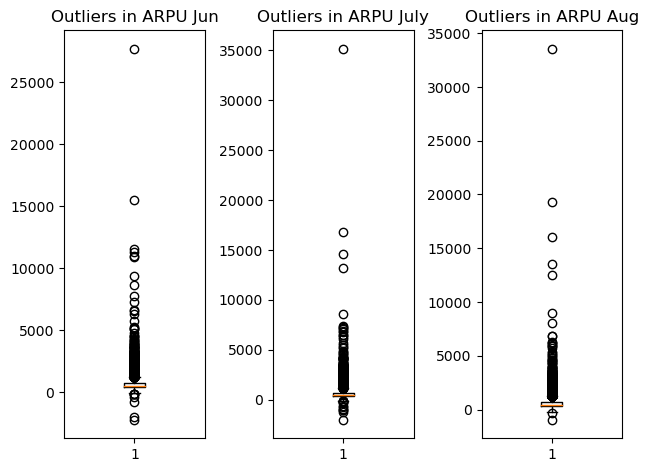

In [66]:
# Checking boxplot for arpu for all 3 months
plt.subplot(1,3,1)
plt.boxplot(high_value_customers.arpu_6)
plt.title("Outliers in ARPU Jun")
plt.tight_layout(pad = 1.0)

plt.subplot(1,3,2)
plt.boxplot(high_value_customers.arpu_7)
plt.title("Outliers in ARPU July")
plt.tight_layout(pad = 1.0)

plt.subplot(1,3,3)
plt.boxplot(high_value_customers.arpu_8)
plt.title("Outliers in ARPU Aug")


### Observations:

- It is observed that, there are few outliers present in ARPU for all 3 months.
- since checking outliers for all 128 columns is a tedious process. 
- Therefore Lets remove outliers below 10th and above 90th percentile from all the columns

In [67]:
no_outliers_check_cols =  ["mobile_number", "is_decreased_arpu_action", "is_decreased_mou_action", "is_decreased_rech_num_action", "is_decreased_rech_amt_action", "is_decreased_vbc", "churn"]
outliers_check_cols = []
columns = high_value_customers.columns
for col in columns:
    if col not in no_outliers_check_cols:
        outliers_check_cols.append(col)
print(outliers_check_cols)
print(len(outliers_check_cols))


high_value_customers.shape

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'lo

(30011, 135)

In [68]:
def drop_row(x, col):
    high_value_customers
    

# Removing outliers below 10th and above 90th percentile
for col in outliers_check_cols: 
    q1 = high_value_customers[col].quantile(0.10)
    q3 = high_value_customers[col].quantile(0.90)
    iqr = q3-q1
    low_range  = q1-1.5*iqr
    high_range = q3+1.5*iqr
    df = high_value_customers.loc[(high_value_customers[col] > low_range) & (high_value_customers[col] < high_range)]
    #high_value_customers[col] = high_value_customers[col].apply(lambda x : x if x > low_range and x < high_range else high_value_customers.drop(axis=0))
    
df.head()

high_value_customers = df

high_value_customers.shape

(29700, 135)

Text(0.5, 1.0, 'Outliers in ARPU Aug')

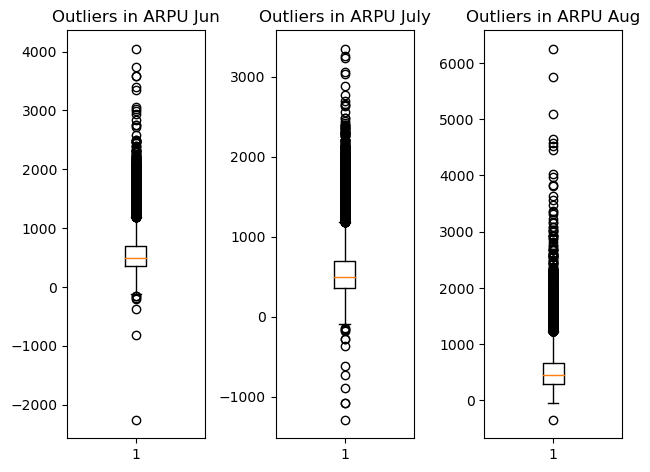

In [69]:
#Checking boxplot again for arpu for all 3 months
plt.subplot(1,3,1)
plt.boxplot(high_value_customers.arpu_6)
plt.title("Outliers in ARPU Jun")
plt.tight_layout(pad = 1.0)

plt.subplot(1,3,2)
plt.boxplot(high_value_customers.arpu_7)
plt.title("Outliers in ARPU July")
plt.tight_layout(pad = 1.0)

plt.subplot(1,3,3)
plt.boxplot(high_value_customers.arpu_8)
plt.title("Outliers in ARPU Aug")


Text(0.5, 1.0, 'Outliers in ARPU Aug')

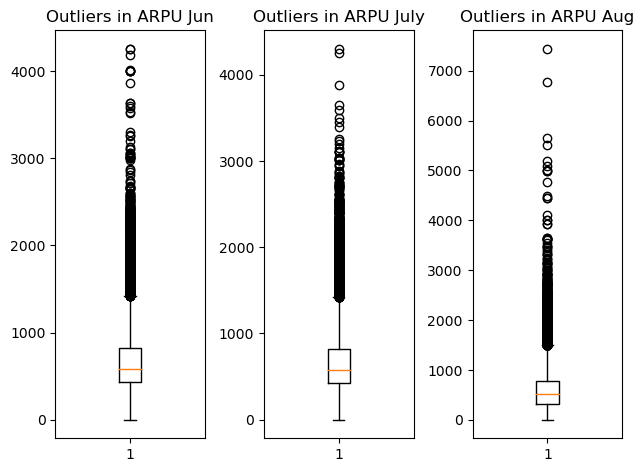

In [70]:
#Checking boxplot  for total_rech_amt for all 3 months
plt.subplot(1,3,1)
plt.boxplot(high_value_customers.total_rech_amt_6)
plt.title("Outliers in ARPU Jun")
plt.tight_layout(pad = 1.0)

plt.subplot(1,3,2)
plt.boxplot(high_value_customers.total_rech_amt_7)
plt.title("Outliers in ARPU July")
plt.tight_layout(pad = 1.0)

plt.subplot(1,3,3)
plt.boxplot(high_value_customers.total_rech_amt_8)
plt.title("Outliers in ARPU Aug")



### Observations:

- Now the outliers has been handled with care.
- The numeric columns are now adjusted with correct values without muchh outliers.
- The Dataframe is now perfect for EDA process.


## Exploratory Data Analysis - EDA

- Exploratory Data Analysis (EDA) is an analysis approach that identifies general patterns in the data.
- It also helps us to interpret the linerity or multicolinearity between variables

## Univarite Analysis

- It involves analysis of only one variable

#### Lets first analyse the churn rate on the basis of whether the customer has decreased Avergae Revenue from good phase to action phase

Text(0.5, 1.0, 'Churn Rate on basis of ARPU')

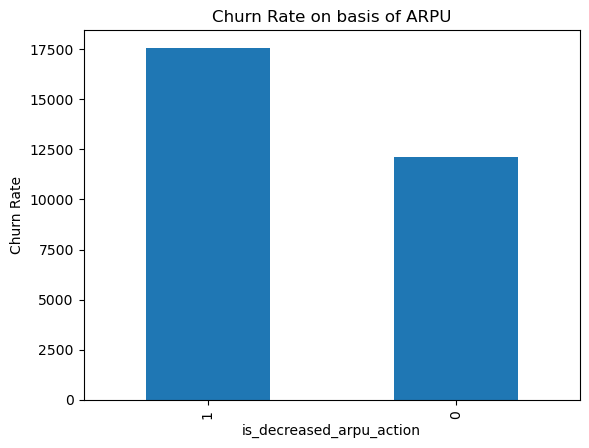

In [71]:
high_value_customers.is_decreased_arpu_action.value_counts().plot.bar()
plt.ylabel("Churn Rate")
plt.title("Churn Rate on basis of ARPU")

### Observations:


- It is observed that there is increased number of customers who have decreased their average revenue in action phase
- Therefore the number of customers likely to be churn seems to be higher than non-churn customers.

#### Lets first analyse the churn rate on the basis of whether the customer has decreased their usage from good phase to action phase

Text(0.5, 1.0, 'Churn Rate on basis of MOU')

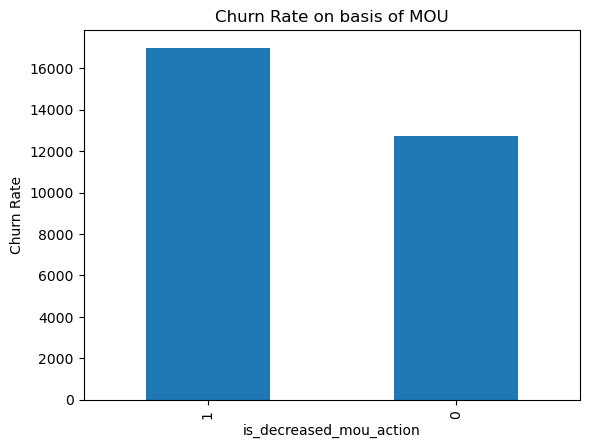

In [72]:
high_value_customers.is_decreased_mou_action.value_counts().plot.bar()
plt.ylabel("Churn Rate")
plt.title("Churn Rate on basis of MOU")

### Observations:

- It is observed that there is increased number of customers who have decreased their minutes of usage in action phase
- Therefore the number of customers likely to be churn seems to be higher than non-churn customers.

#### Lets first analyse the churn rate on the basis of whether the customer has decreased their recharge times from good phase to action phase

Text(0.5, 1.0, 'Churn Rate on basis of Total Rech Num')

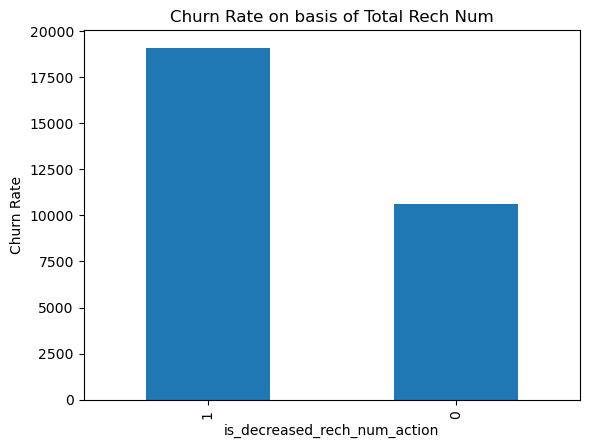

In [73]:
high_value_customers.is_decreased_rech_num_action.value_counts().plot.bar()
plt.ylabel("Churn Rate")
plt.title("Churn Rate on basis of Total Rech Num")

### Observations:

- It is observed that there is increased number of customers who have decreased number of rechargers in action phase
- Therefore the number of customers likely to be churn seems to be higher than non-churn customers.

#### Lets first analyse the churn rate on the basis of whether the customer has decreased total recharge amount from good phase to action phase

Text(0.5, 1.0, 'Churn Rate on basis of Total Rech Amt')

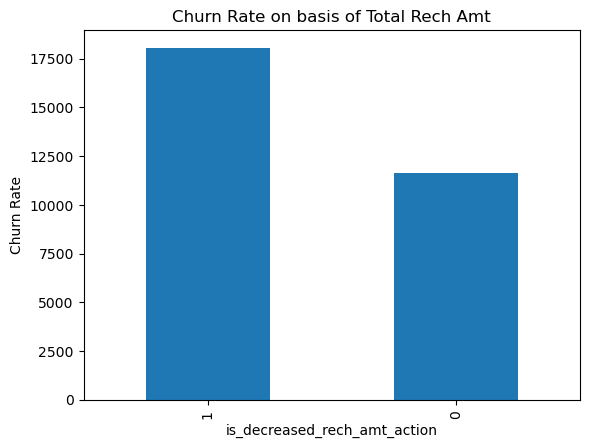

In [74]:
high_value_customers.is_decreased_rech_amt_action.value_counts().plot.bar()
plt.ylabel("Churn Rate")
plt.title("Churn Rate on basis of Total Rech Amt")

### Observations:

- It is observed that there is increased number of customers who have decreased their total recharge amount in action phase
- Therefore the number of customers likely to be churn seems to be higher than non-churn customers.

#### Lets first analyse the churn rate on the basis of whether the customer has decreased their volume based cost for data usage from good phase to action phase

Text(0.5, 1.0, 'Churn Rate on basis of Volume Based Cost for Data')

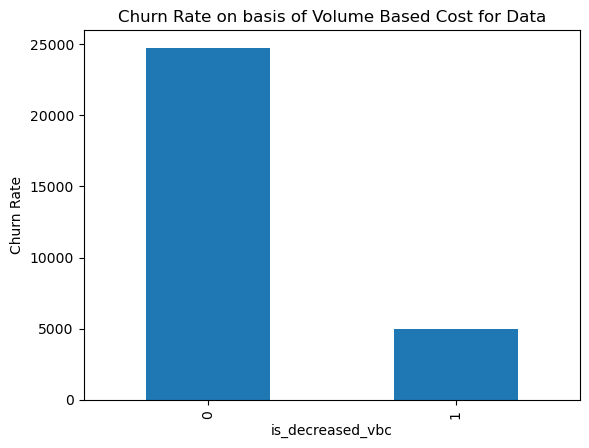

In [75]:
high_value_customers.is_decreased_vbc.value_counts().plot.bar()
plt.ylabel("Churn Rate")
plt.title("Churn Rate on basis of Volume Based Cost for Data")

### Observations:

- Volume based Cost shows different result, as the number of customers who are likely to be churn are less.
- This also indicates that the most of the customer are still using the network for internet data usage but the customers do not do the monthly recharge more when they are in the action phase

### Bivariate Analysis

- It involves analysis of two variables comparatively

In [76]:
high_value_customers.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action,is_decreased_vbc,churn
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,2014-06-27,2014-07-25,2014-08-26,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1185.0,0,1,0,0,0,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,2014-06-25,2014-07-31,2014-08-30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,1,1,1,1,1,0
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,1

### Analysis of churn rate by the decreasing recharge amount and number of recharge in the action phase

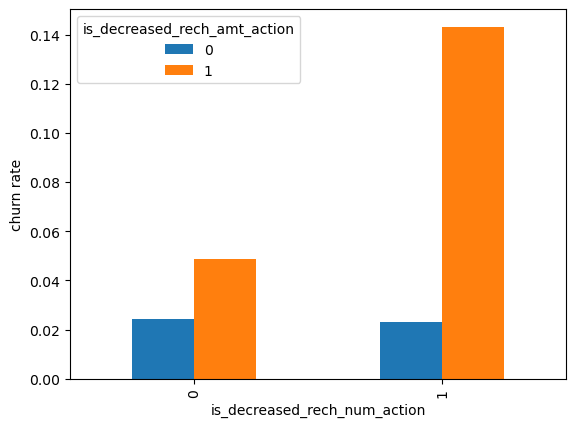

In [77]:
# Lets the correlation between recharge amount and number of recharges
#plt.scatter(high_value_customers.total_rech_amt_8, high_value_customers.total_rech_num_8)
high_value_customers.pivot_table(values='churn', index='is_decreased_rech_num_action', columns='is_decreased_rech_amt_action', aggfunc='mean').plot.bar()
plt.ylabel("churn rate")
plt.show()

### Observations:

- From the above bivariate analysis of two variables, it is obvious that customers who have decreased their number of recharge times have also decreased thier recharge amount as well.
- It is also evident that there are few customers who have not decreased their recharge times but have decreased thier recharge amount. These customers may likely to be churn.

### Analysis of churn rate by the decreasing recharge amount and volume based cost in the action phase

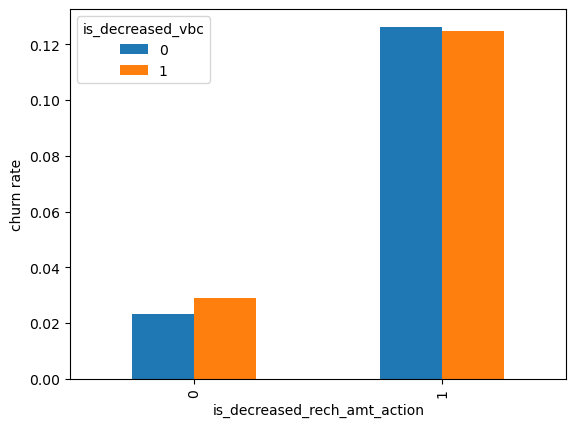

In [78]:
high_value_customers.pivot_table(values='churn', index='is_decreased_rech_amt_action', columns='is_decreased_vbc', aggfunc='mean').plot.bar()
plt.ylabel("churn rate")
plt.show()

### Observations:

- From the above graph, it shows that there are equal set of customers.
1. who have reduced their recharge amount but not reduced their volume based data cost
2. who have reduced their recharge amount and also reduced their volume based data cost

### Analysing the scatter of total recharge amount and the number of recharges


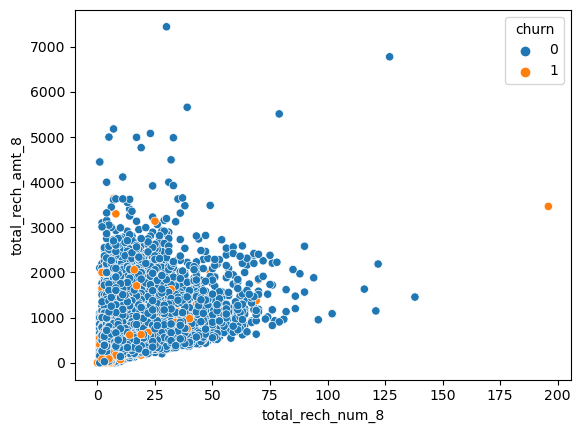

In [79]:
scatter = sns.scatterplot(x='total_rech_num_8', y='total_rech_amt_8', hue='churn', data=high_value_customers)

### Analysying the cor-relation matrix using heatmap

In [80]:
removing_cols = ['mobile_number', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']
filtered_cols =[]
columns = high_value_customers.columns
for col in columns:
    if col not in removing_cols:
        filtered_cols.append(col)
        
filtered_df = high_value_customers.loc[:, filtered_cols]
filtered_df.head()


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action,is_decreased_vbc,churn
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1185.0,0,1,0,0,0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,1,1,1,1,1,0
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,380.0,0,0,0,0,0,0
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.7

In [82]:
#sns.heatmap(filtered_df.corr(), annot=True, cmap="RdYlGn")
plt.figure(figsize=[40,40])
plt.show()

<Figure size 4000x4000 with 0 Axes>

## Splitting the dataframe into train and test using train_test_split

In [83]:
# importing the necessary librabries
from sklearn.model_selection import train_test_split

In [84]:
date_cols = ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']
high_value_customers.drop(date_cols, axis=1, inplace=True)

# creating X set
X = high_value_customers.drop(['mobile_number', 'churn'], axis=1)

# creating y set
y = high_value_customers['churn']

In [85]:
#splitting the dataframe
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, test_size=0.3)

In [86]:
print(X_train.shape, X_test.shape)

(20790, 130) (8910, 130)


In [87]:
print(y_train.shape, y_test.shape)

(20790,) (8910,)


## Checking the class balance of the dataframe

In [88]:
#checking the balance of the target variable 'churn' ie 'y'
y.value_counts(normalize=True)

churn
0    0.913973
1    0.086027
Name: proportion, dtype: float64

### Observations:

- The dataframe is highly imbalanced. 
- The churn rate is only 8% whereas the non-churn rate is 91%
- We need to handle class imbalance by using any of the menthods available.

## Handling Class Imbalance

### Synthetic minority oversampling technique (SMOTE)

Using this technique, you can generate new data points that lie on the vector between two data points that belong to the minority class. These data points are randomly selected and then assigned to the minority class. This method uses the K-nearest neighbours to create random synthetic samples. The steps involved in this method are as follows:


- Identifying the feature vector and its nearest neighbour
- Taking the difference between the two
- Multiplying the difference with a random number between 0 and 1
- Identifying a new point on the line segment by adding the random number to the feature vector
- Repeating the process for identified feature vectors

In [89]:
#importing the necessary library
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE

#initialising the object
smote = SMOTE(random_state=40)

In [90]:
#fitting the X_train, y_train with SMOTE
X_train, y_train = smote.fit_resample(X_train, y_train)

In [91]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action,is_decreased_vbc
0,362.528,314.380,136.601,61.11,27.34,20.13,199.68,173.61,41.39,0.00,0.00,0.00,0.00,0.00,0.00,61.11,27.34,20.13,184.48,170.46,40.09,3.70,0.00,1.30,0.0,0.00,0.00,249.29,197.81,61.53,0.00,0.00,0.00,11.49,3.14,0.00,0.00,0.00,0.00,11.49,3.14,0.00,0.0,0.0,0.0,1.06,1.78,3.76,1.23,0.0,0.0,263.09,202.74,65.29,51.18,54.91,16.76,115.98,130.63,47.38,0.00,0.56,1.29,167.16,186.11,65.44,0.00,0.00,0.00,26.29,8.26,0.00,0.00,1.73,0.00,26.29,9.99,0.00,194.33,197.28,65.44,0.38,0.0,0.00,0.11,0.00,0.00,0.36,1.16,0.00,11,5,4,460,360,100,110,110,30,110,110,30,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,3216,0.00,0.00,0.00,410.0,1,1,1,1,0
1,436.759,301.199,143.741,8.66,16.83,5.13,359.14,234.54,90.76,6.28,13.26,1.23,40.06,20.09,0.00,5.23,10.10,5.13,37.86,50.39,40.84,0.00,6.38,0.21,0.0,0.00,0.00,43.09,66.88,46.19,3.43,0.00,0.00,182.36,71.81,19.69,98.19,84.91,29.99,283.99,156.73,49.69,0.0,0.0,0.0,2.05,8.54,0.00,1.13,0.0,0.0,330.28,232.16,95.89,17.04,32.73,18.49,24.36,22.19,32.41,11.83,22.68,26.79,53.24,77.61,77.71,3.15,0.95,0.96,32.09,25.16,62.99,20.68,44.34,38.41,55.93,70.46,102.38,118.49,166.78,203.54,0.00,0.0,0.00,9.31,18.70,18.54,0.00,0.00,4.89,5,5,3,440,400,80,110,130,30,110,130,20,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,2463,0.00,0.00,0.00,420.0,1,1,1,1,0
2,396.333,585.774,493.664,30.93,50.84,33.44,426.18,570.13,495.68,0.00,50.48,0.00,0.00,24.19,0.00,6.79,41.21,9.46,323.89,358.63,361.21,1.05,10.91,1.78,0.0,0.00,0.00,331.74,410.76,372.46,24.13,9.63,23.98,101.23,176.38,130.44,0.00,0.00,2.23,125.36,186.01,156.66,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,457.11,596.78,529.13,67.06,36.74,79.08,746.49,724.58,832.06,12.68,13.86,23.94,826.24,775.19,935.09,102.44,60.06,57.79,10.04,15.36,20.94,4.01,0.00,1.53,116.51,75.43,80.28,943.54,850.98,1015.51,0.44,0.0,0.00,0.00,0.00,0.00,0.33,0.35,0.13,6,7,3,503,763,630,250,250,250,110,250,250,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,1827,0.00,0.00,0.00,633.0,0,0,1,1,0
3,378.490,475.188,652.650,37.01,42.24,30.99,200.14,299.44,262.63,13.04,7.65,5.93,46.78,33.71,95.68,32.39,42.24,24.53,156.81,157.11,88.76,0

## Scaling the features/variables

In [92]:
#importing the libraries
from sklearn.preprocessing import StandardScaler

#initiating the object
scaler = StandardScaler()


#Fit the data into scaler and transform
X_train[X_train.columns] = scaler.fit_transform(X_train[X_train.columns])


In [93]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action,is_decreased_vbc
0,-0.662939,-0.679552,-0.651163,-0.565524,-0.593098,-0.447882,-0.483180,-0.470562,-0.552153,-0.220672,-0.192474,-0.216502,-0.269146,-0.293496,-0.280633,-0.077891,-0.222362,-0.204224,0.165235,0.164794,-0.340530,-0.083916,-0.291925,-0.175201,-0.250366,-0.204472,-0.214443,0.055498,-0.045238,-0.351980,-0.539327,-0.510866,-0.370680,-0.522271,-0.509828,-0.392225,-0.150882,-0.146221,-0.127832,-0.742363,-0.712205,-0.507263,-0.120922,-0.11699,-0.072721,-0.301357,-0.282448,-0.063805,0.188627,-0.014819,-0.010929,-0.700777,-0.710271,-0.612217,-0.051118,0.006860,-0.203024,-0.102152,0.030185,-0.278149,-0.315582,-0.268341,-0.224429,-0.135461,-0.017889,-0.321308,-0.236329,-0.225753,-0.189716,-0.056715,-0.210452,-0.263337,-0.135346,-0.034781,-0.107193,-0.187723,-0.282445,-0.305137,-0.217583,-0.158596,-0.405202,1.737249,-0.127887,-0.162284,-0.177627,-0.164602,-0.125074,-0.061467,-0.003175,-0.078978,-0.198469,-0.710819,-0.449003,-0.593154,-0.668233,-0.732460,-0.313645,-0.280309,-0.613578,0.111823,0.182262,-0.293057,-0.269177,-0.252087,-0.200342,-0.299968,-0.291076,-0.254527,-0.253079,-0.255229,-0.23475,-0.267750,-0.274978,-0.264748,-0.264491,-0.255988,-0.227543,-0.139567,-0.127713,-0.111566,2.450020,-0.271924,-0.297555,-0.294947,-0.836730,0.652439,0.683714,0.633796,0.621249,-0.380099
1,-0.447481,-0.720131,-0.631680,-0.675749,-0.616305,-0.487306,-0.166528,-0.345601,-0.427732,-0.151226,-0.048687,-0.200914,0.036462,-0.088391,-0.280633,-0.351889,-0.311981,-0.296767,-0.514816,-0.425886,-0.336530,-0.302761,0.093916,-0.243938,-0.250366,-0.204472,-0.214443,-0.569410,-0.465238,-0.406125,-0.531582,-0.510866,-0.370680,-0.162580,-0.360081,-0.333489,8.969009,8.173745,3.494963,-0.328319,-0.468819,-0.409764,-0.120922,-0.11699,-0.072721,-0.245707,0.062817,-0.266645,0.143841,-0.014819,-0.010929,-0.602085,-0.665841,-0.560218,-0.283975,-0.154667,-0.188697,-0.536396,-0.536468,-0.363245,-0.009714,0.240436,0.486125,-0.509453,-0.410264,-0.272933,-0.190968,-0.211676,-0.170683,0.003710,-0.040317,0.559995,1.120987,2.524440,2.474732,0.043274,0.182643,0.692524,-0.436044,-0.252877,0.057000,-0.36

- Note: We do fit and transform on train sets but we do only transform on test sets

In [94]:
X_test[X_test.columns] = scaler.transform(X_test[X_test.columns])

In [95]:
X_test.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_rech_amt_6n7,is_decreased_arpu_action,is_decreased_mou_action,is_decreased_rech_num_action,is_decreased_rech_amt_action,is_decreased_vbc
3470,-1.157691,0.426566,1.095977,0.246354,2.126072,1.919878,-0.799694,-0.600794,-0.175539,-0.220672,-0.150943,0.143940,-0.269146,0.596143,0.872840,-0.360813,-0.336465,-0.293189,-0.599556,-0.357063,-0.406721,-0.261358,-0.200605,-0.072412,-0.250366,0.724768,2.877372,-0.628143,-0.451091,-0.440927,0.463303,2.283953,2.135567,-0.505136,-0.456860,-0.142875,-0.150882,-0.146221,-0.127832,-0.055324,1.182797,1.328047,-0.120922,-0.116990,-0.072721,-0.214228,0.578160,1.977003,-0.362243,-0.014819,-0.010929,-0.367494,0.930092,0.998732,-0.345429,-0.310879,-0.099754,-0.422314,-0.218548,-0.404855,0.610813,-0.109176,0.107720,-0.381255,-0.322821,-0.313029,-0.194856,-0.127067,-0.151848,0.091117,0.010522,-0.151451,-0.135346,-0.138688,-0.107193,-0.054689,-0.075628,-0.203013,-0.335455,-0.188024,-0.363065,0.628854,1.396634,-0.162284,0.130788,0.614117,-0.125074,-0.053881,0.178297,-0.078978,-0.407935,0.704413,1.444933,-1.012760,0.241439,1.313545,-0.313645,-0.280309,0.178222,0.111823,0.182262,0.580538,-0.266636,-0.232576,-0.183146,0.728165,0.155266,0.603799,-0.253079,-0.255229,-0.234750,-0.267750,2.714939,2.487009,1.944929,-0.255988,-0.227543,-0.139567,-0.127713,-0.111566,-0.578035,-0.231645,-0.176700,-0.255118,-0.523377,-1.532709,-1.462600,-1.577796,-1.609659,2.630897
60147,-0.186639,-0.693338,0.878878,-0.632626,-0.485587,-0.190232,-0.379801,-0.289919,0.138500,-0.220672,-0.192474,-0.216502,-0.269146,-0.293496,-0.280633,-0.234454,0.025857,0.269287,0.108000,0.292799,0.376159,0.527075,0.402952,0.669186,0.582781,-0.204472,-0.214443,-0.047330,0.228292,0.440459,-0.539327,-0.508647,-0.308065,-0.419544,-0.405592,-0.015531,-0.150882,0.124220,-0.127832,-0.668215,-0.630596,-0.217729,-0.120922,-0.116990,-0.072721,-0.065266,-0.373361,-0.266645,-0.362243,-0.014819,-0.010929,-0.674573,-0.506409,0.013674,0.297281,1.515811,1.392236,0.957390,1.006726,3.279737,-0.061166,0.288738,-0.026031,0.798469,1.494834,2.933830,-0.236329,-0.225753,-0.116161,2.798766,1.979654,1.768918,-0.135346,-0.138688,-0.097110,1.948378,1.377473,1.247581,1.388905,1.797975,2.892198,-0.368702,-0.127887,-0.162284,-0.179623,

# Model Building 

## Model Building with the help of Principal Component Analysis (PCA)

In [96]:
#Import PCA
from sklearn.decomposition import PCA

In [97]:
# initialising PCA object
pca = PCA(random_state=40)

In [98]:
# Fitting the train  set on PCA 
pca.fit(X_train)

PCA(random_state=40)

In [99]:
# checking the componenets of pca
pca.components_

array([[ 5.40601038e-02,  1.38859173e-01,  1.86370722e-01, ...,
        -6.30521587e-02, -1.00126123e-01,  3.89820270e-02],
       [ 8.55504830e-02,  1.50283367e-01,  1.00996357e-01, ...,
        -3.24032994e-02, -2.61645578e-02, -7.77041577e-02],
       [-7.97185772e-02,  8.13467650e-02,  1.77167558e-01, ...,
        -1.32569922e-01, -1.62300892e-01,  7.96515912e-02],
       ...,
       [ 1.68962619e-07, -3.22325044e-07, -5.18881546e-07, ...,
         1.49302881e-08,  1.06826706e-07, -1.31526137e-07],
       [-2.40806661e-07,  1.33702506e-07, -5.38535044e-07, ...,
        -2.20670351e-08,  6.07858876e-08,  7.97586425e-08],
       [-1.73506528e-07,  1.01560045e-07, -5.59911595e-09, ...,
         1.19346714e-08,  4.70284008e-08, -5.22295952e-08]])

In [100]:
# Cumuliative varinace of the PCs
variance_cumu = np.cumsum(pca.explained_variance_ratio_)
print(variance_cumu)

[0.10359116 0.18191038 0.23654769 0.28023671 0.32073348 0.35556446
 0.38920504 0.41718732 0.4415695  0.4654769  0.48706511 0.50855696
 0.52897942 0.54886824 0.56828265 0.58565125 0.60289007 0.61802109
 0.63217945 0.64565141 0.65835194 0.67090792 0.68300977 0.69433535
 0.70560394 0.71663838 0.7264139  0.7358084  0.74461111 0.75324918
 0.76166717 0.76972739 0.77773604 0.78549029 0.7930671  0.8004797
 0.80778617 0.81485239 0.82124718 0.82736264 0.83341913 0.83931676
 0.84515372 0.85043305 0.85564604 0.86069107 0.86567575 0.87046227
 0.87517385 0.87962253 0.88389421 0.88809754 0.89220298 0.89623316
 0.90024766 0.90400996 0.90773652 0.91133973 0.91480917 0.91825313
 0.92157713 0.92484894 0.92803465 0.93100813 0.9338684  0.93670641
 0.93953358 0.94223769 0.94490048 0.94740154 0.94989594 0.95236033
 0.95477748 0.95708998 0.95936196 0.96150028 0.963593   0.96567208
 0.96768909 0.96962656 0.97150896 0.97336138 0.97518456 0.97695066
 0.97864824 0.98030236 0.98192203 0.98348963 0.98502376 0.98650

### Scree Plot

Text(0, 0.5, 'Cumulative Variance')

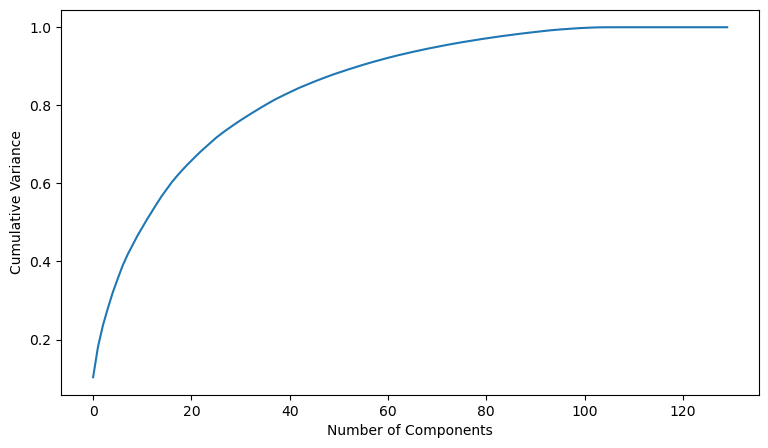

In [101]:
fig = plt.figure(figsize = (9,5))
plt.plot(variance_cumu)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance')

### Observations:

- It is observed that, 80 components explains nearly 95% of the data.
- Therefore, we can select 75 components for our analysis

### Performing PCA again with 75 components

In [102]:
# Importing incremental PCA
from sklearn.decomposition import IncrementalPCA

In [103]:
pca_2 = IncrementalPCA(n_components=75)

In [104]:
#Fitting the X_train
X_train_pca = pca_2.fit_transform(X_train)

#transforming the y_train
X_test_pca = pca_2.transform(X_test)

We are only doing Transform in the test set not the Fit-Transform. Because the Fitting is already done on the train set. So, we just have to do the transformation with the already fitted data on the train set.

# Selecting the appropriate Model Evaluation Metrics

- Since we need to focus more about churn cases than the not churn cases. 
- Therefore the main goal is to reatin the customers, who have the possiblity to churn. 
- There should not be a problem, if we consider few not churn customers as churn customers and provide them some incentives for retaining them. 
- Hence, the sensitivity score/recall score is more important here than accuracy.

# Model 1 : Logistic Regression with PCA

In [105]:
#importing the libraries
from sklearn.linear_model import LogisticRegression

In [106]:
# Impoting metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix

#### Before creating the logistic model, lets tune the parameters using hyperparameter tunning techniques

## Hyperparameter Tunning

In [107]:
#importing the necessary libraries
from sklearn.model_selection import KFold
from  sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [108]:
#creating kFold with 5 splits
folds = KFold(n_splits=5)

#hyperparams
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

#creating gridsearchcv
model_cv = GridSearchCV(estimator=LogisticRegression(), 
                        param_grid=params,
                        scoring="recall",
                        cv=folds,
                        return_train_score=True,
                        verbose=-1)

#fitting the model into train set
model_cv.fit(X_train_pca, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='recall', verbose=-1)

In [109]:
#results of GridSearchCV
results_cv = pd.DataFrame(model_cv.cv_results_)
results_cv.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.256982,0.011839,0.008444,0.001056,0.01,{'C': 0.01},0.830861,0.841693,0.892685,0.826842,0.816316,0.841679,0.026766,1,0.914984,0.915641,0.895833,0.805351,0.811579,0.868678,0.049715
1,0.379464,0.040805,0.008761,0.001740,0.1,{'C': 0.1},0.827893,0.833856,0.891077,0.829605,0.819211,0.840328,0.025818,3,0.915748,0.916077,0.896984,0.807982,0.813684,0.870095,0.048912
2,0.465446,0.044147,0.007411,0.005412,1,{'C': 1},0.827893,0.832288,0.891077,0.830263,0.820263,0.840357,0.025685,2,0.915584,0.915804,0.897045,0.808772,0.814912,0.870424,0.048353
3,0.495679,0.048157,0.002224,0.002560,10,{'C': 10},0.827893,0.830721,0.891881,0.829737,0.819737,0.839994,0.026231,6,0.915857,0.915478,0.896984,0.808947,0.814912,0.870436,0.048292
4,0.460946,0.027772,0.006327,0.004678,100,{'C': 100},0.827893,0.830721,0.891881,0.830132,0.819605,0.840046,0.026221,5,0.915748,0.915532,0.896621,0.808860,0.815614,0.870475,0.048103


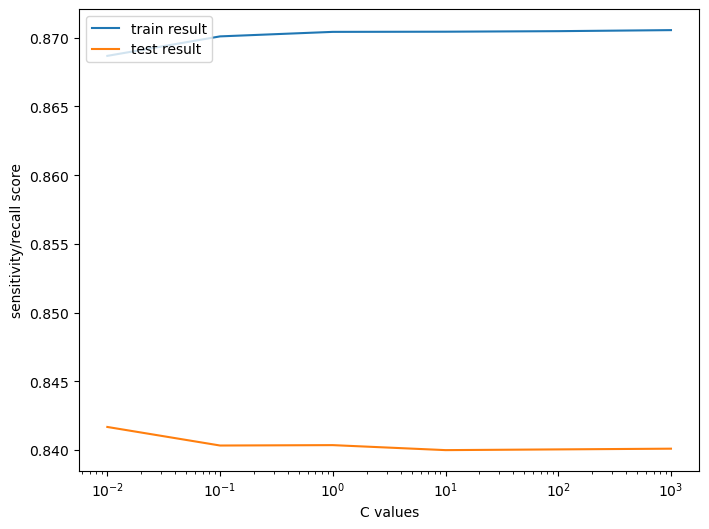

In [110]:

#plotting the graph of c values vs validation scores
plt.figure(figsize=(8, 6))
plt.plot(results_cv['param_C'], results_cv['mean_train_score'])
plt.plot(results_cv['param_C'], results_cv['mean_test_score'])
plt.xlabel('C values')
plt.ylabel('sensitivity/recall score')
plt.legend(['train result', 'test result'], loc='upper left')
plt.xscale('log')

In [111]:
#Getting best score with best c value
best_score = model_cv.best_score_
best_C_val = model_cv.best_params_['C']
print(" The highest test sensitivity is {0} at C = {1}".format(best_score, best_C_val))

 The highest test sensitivity is 0.841679221257986 at C = 0.01


### Logistic Regression with best C value

In [113]:
# creating object
lr_pca = LogisticRegression(C=best_C_val)

#fitting the  model
lr_pca_model = lr_pca.fit(X_train_pca, y_train)

### Making Prediction on train set

In [114]:
#predicting on test set
y_train_pred = lr_pca_model.predict(X_train_pca)

In [115]:
#Getting the confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion_matrix)

[[15989  3011]
 [ 2330 16670]]


In [116]:
TP = confusion_matrix[1,1] # true positive 
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

In [117]:
# Accuracy
print("Accuracy on train set: ",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity on train set: ",TP / float(TP+FN))

# Specificity
print("Specificity on train set: ", TN / float(TN+FP))

Accuracy on train set:  0.8594473684210526
Sensitivity on train set:  0.8773684210526316
Specificity on train set:  0.8415263157894737


### Making Prediction on test set

In [118]:
y_test_pred = lr_pca_model.predict(X_test_pca)

In [119]:
#Getting the confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion_matrix)

[[6805 1340]
 [ 158  607]]


In [120]:
TP = confusion_matrix[1,1] # true positive 
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

# Accuracy
print("Accuracy on Test set: ",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity on Test set: ",TP / float(TP+FN))

# Specificity
print("Specificity on Test set: ", TN / float(TN+FP))

Accuracy on Test set:  0.8318742985409652
Sensitivity on Test set:  0.7934640522875817
Specificity on Test set:  0.8354818907305095


### Model Summary

- The model is pretty good. 
- It is performing well on the test set based on algorithms learned from train set
- Though the accuracy score has been dropped by 3%, the sensivity/recall is still maintained.


Train Set :
- Accuracy on train set:  0.85
- Sensitivity on train set:  0.87
- Specificity on train set:  0.83


Test Set:
- Accuracy on Test set:  0.82
- Sensitivity on Test set:  0.82
- Specificity on Test set:  0.82

# Decision Tree with PCA

In [121]:
#import the library
from sklearn.tree import DecisionTreeClassifier

## Hyperparamater Tunning

In [122]:
#creating the params
params_grid = {'max_depth' : range(5,15,5), 
               'min_samples_leaf' : range(50, 150,50),
               'min_samples_split' : range(50, 150, 50)
              }

d_tree = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator=d_tree,
                           param_grid=params_grid,
                           cv=5,
                           scoring="recall",
                           verbose=1,
                           n_jobs=-1)

#fitting the grid search to data
grid_search.fit(X_train_pca, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             scoring='recall', verbose=1)

In [123]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,4.825583,0.420942,0.021828,0.003156,5,50,50,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.733684,0.733947,0.747368,0.763421,0.735263,0.742737,0.011527,7
1,5.139651,0.303765,0.022805,0.008524,5,50,100,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.733684,0.733947,0.747368,0.763421,0.735263,0.742737,0.011527,7
2,5.116936,0.165294,0.016079,0.004887,5,100,50,"{'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.739737,0.737632,0.748421,0.755000,0.741053,0.744368,0.006439,5
3,4.924940,0.373309,0.020705,0.014435,5,100,100,"{'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 100}",0.739737,0.737632,0.748421,0.755000,0.741053,0.744368,0.006439,5
4,7.821208,0.424505,0.021880,0.013882,10,50,50,"{'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 50}",0.811579,0.844737,0.824737,0.833158,0.843947,0.831632,0.012453,1
5,8.072532,0.856830,0.020265,0.016534,10,50,100,"{'max_depth': 10, 'min_samples_leaf': 50, 'min_samples_split': 100}",0.811053,0.844737,0.824737,0.833158,0.843947,0.831526,0.012623,2
6,7.895637,0.466320,0.017415,0.010989,10,100,50,"{'max_depth': 10, 'min_samples_leaf': 100, 'min_samples_split': 50}",0.799211,0.821842,0.812895,0.830263,0.831579,0.819158,0.012016,3
7,6.130390,0.373739,0.010192,0.000024,10,100,100,"{'max_depth': 10, 'min_samples_leaf': 100, 'min_samples_split': 100}",0.799211,0.821842,0.812895,0.830263,0.831579,0.819158,0.012016,3


In [124]:
# Printing the optimal sensitivity score and hyperparameters
print("Best sensitivity: ", grid_search.best_score_)
print("Best Estimator: ", grid_search.best_estimator_)

Best sensitivity:  0.8316315789473684
Best Estimator:  DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=50)


### Making model with best hyperparameters

In [125]:
# Model with optimal hyperparameters
dt_pca_model = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)

dt_pca_model.fit(X_train_pca, y_train)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=50,
                       random_state=100)

### Making Prediction on Train Set

In [126]:
y_train_pred = dt_pca_model.predict(X_train_pca)

In [127]:
#getting confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion_matrix)

TP = confusion_matrix[1,1] # true positive 
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

# Accuracy
print("Accuracy on train set: ",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity on train set: ",TP / float(TP+FN))

# Specificity
print("Specificity on train set: ", TN / float(TN+FP))

[[16021  2979]
 [ 2641 16359]]
Accuracy on train set:  0.8521052631578947
Sensitivity on train set:  0.861
Specificity on train set:  0.8432105263157895


### Making Predictions on Test Set

In [128]:
y_test_pred = dt_pca_model.predict(X_test_pca)

In [129]:
#getting confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion_matrix)

TP = confusion_matrix[1,1] # true positive 
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

# Accuracy
print("Accuracy on test set: ",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity on test set: ",TP / float(TP+FN))

# Specificity
print("Specificity on test set: ", TN / float(TN+FP))

[[6626 1519]
 [ 240  525]]
Accuracy on test set:  0.8025813692480359
Sensitivity on test set:  0.6862745098039216
Specificity on test set:  0.8135052179251074


## Model Summary

- The Sesitivity has been decreased while evaluating the model on the test set.
- However, the accuracy and specificity is quite good in the test set.

Train Set :
- Accuracy on train set:  0.85
- Sensitivity on train set:  0.85
- Specificity on train set:  0.85


Test Set:
- Accuracy on Test set:  0.81
- Sensitivity on Test set:  0.73
- Specificity on Test set:  0.82

# Random Forest Model with PCA

In [130]:
# Importing random forest classifier
from sklearn.ensemble import RandomForestClassifier

## Hyperparameter Tunning

In [131]:
''''
params_grid = {'max_depth' : range(5,15,5), 
               'min_samples_leaf' : range(50, 150,50),
               'min_samples_split' : range(50, 150, 50),
               'n_estimators': [100,200,300], 
               'max_features': [10, 20]
              }
rf = RandomForestClassifier(n_jobs=-1)

# Instantiate the grid search model
grid_search_rf = GridSearchCV(estimator = rf, 
                           param_grid = params_grid, 
                           cv = 3,
                           n_jobs = -1,
                           verbose = 1, 
                           scoring = "recall",
                           return_train_score=True)
                           
                           
''''

SyntaxError: unterminated string literal (detected at line 20) (1072920853.py, line 20)

In [133]:
#grid_search_rf.fit(X_train_pca, y_train)

In [134]:
# getting the best accuracy and estimators
#print("Best accuracy Score: ", grid_search.best_score_)
#print("Best Estimators: ", grid_search.best_estimator_)

### Building Model with best hyperparameters

In [135]:
rf_model_pca = RandomForestClassifier(max_depth=5, min_samples_leaf=50, min_samples_split=100, max_features=20, n_estimators=300)


In [136]:
# Fit the model
rf_model_pca.fit(X_train_pca, y_train)

RandomForestClassifier(max_depth=5, max_features=20, min_samples_leaf=50,
                       min_samples_split=100, n_estimators=300)

### Making Prediction on Train Set

In [137]:
y_train_pred = rf_model_pca.predict(X_train_pca)

In [138]:
#getting confusion matrix
confusion_matrix = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion_matrix)

TP = confusion_matrix[1,1] # true positive 
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

# Accuracy
print("Accuracy on train set: ",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity on train set: ",TP / float(TP+FN))

# Specificity
print("Specificity on train set: ", TN / float(TN+FP))

[[16447  2553]
 [ 4204 14796]]
Accuracy on train set:  0.8221842105263157
Sensitivity on train set:  0.7787368421052632
Specificity on train set:  0.8656315789473684


### Making Prediction on Test Set

In [139]:
y_test_pred = rf_model_pca.predict(X_test_pca)

In [140]:
#getting confusion matrix
confusion_matrix = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion_matrix)

TP = confusion_matrix[1,1] # true positive 
TN = confusion_matrix[0,0] # true negatives
FP = confusion_matrix[0,1] # false positives
FN = confusion_matrix[1,0] # false negatives

# Accuracy
print("Accuracy on test set: ",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity on test set: ",TP / float(TP+FN))

# Specificity
print("Specificity on test set: ", TN / float(TN+FP))

[[6995 1150]
 [ 212  553]]
Accuracy on test set:  0.8471380471380472
Sensitivity on test set:  0.722875816993464
Specificity on test set:  0.8588090853284224


### Model Summary

- In Random Forest model also, the Sesitivity has been decreased while evaluating the model on the test set.
- However, the accuracy and specificity is quite good in the test set.

Train Set :
- Accuracy on train set:  0.82
- Sensitivity on train set:  0.78
- Specificity on train set:  0.86


Test Set:
- Accuracy on Test set:  0.85
- Sensitivity on Test set:  0.74
- Specificity on Test set:  0.86

# Logistic Regression without PCA

In [141]:
# Importing stats model
import statsmodels.api as sm

In [142]:
#creating the instance
lr = sm.GLM(y_train,(sm.add_constant(X_train)), family=sm.families.Binomial())

In [143]:
#Fitting the model
lr = lr.fit().summary()

### Observations:

- It is observed that few have positive coefficient and few have negative co-efficient.
- Some of the features have higher p-values and hence became insignificant in the model.
- Now lets perform RFE technique and select minimal features for our analysis

## Selecting optimal Features using RFE

#### Lets take 20 columns for RFE

In [144]:
#importing the library
from sklearn.feature_selection import RFE

#creating instance for logsitic regression
log_reg = LogisticRegression()

#creating the instance for rfe
rfe = RFE(log_reg, n_features_to_select=20)

#fitting the rfe model into train set
rfe = rfe.fit(X_train, y_train)

In [145]:
rfe_20_cols = X_train.columns[rfe.support_]

In [146]:
print(rfe_20_cols)

Index(['offnet_mou_8', 'std_og_t2m_mou_8', 'og_others_7', 'og_others_8',
       'total_og_mou_8', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8',
       'total_ic_mou_8', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_amt_6', 'total_rech_amt_7', 'last_day_rch_amt_8',
       'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'aon',
       'avg_rech_amt_6n7', 'is_decreased_rech_num_action'],
      dtype='object')


## Building Models with RFE Selected Columns

### Model-1:

In [147]:
# Adding constant to X_train
X_train_sm_1 = sm.add_constant(X_train[rfe_20_cols])

#Instantiate the model
log_no_pca_1 = sm.GLM(y_train, X_train_sm_1, family=sm.families.Binomial())

# Fit the model
log_no_pca_1 = log_no_pca_1.fit()

log_no_pca_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38000
Model:                            GLM   Df Residuals:                    37979
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4113.6
Date:                Tue, 23 Jul 2024   Deviance:                       8227.2
Time:                        15:09:11   Pearson chi2:                 1.20e+07
No. Iterations:                    98   Pseudo R-squ. (CS):             0.6896
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                         1.009e+04   2.11e+05      0.048      0.962   -4.03e+05    4.23e+05
offnet_mou_8                    -0.4521      0.127     -3.561      0.000      -0.701      -0.203
std_og_t2m_mou_8                 0.4965      0.114      4.370      0.000       0.274       0.719
og_others_7                     -0.7163      1.078     -0.664      0.507      -2.830       1.397
og_others_8                     -2.1337      2.089     -1.021      0.307      -6.229       1.961
total_og_mou_8                  -0.7532      0.075    -10.040      0.000      -0.900      -0.606
loc_ic_t2m_mou_7                 0.4856      0.061      7.939      0.000       0.366       0.606
loc_ic_t2m_mou_8                -1.2701      0.174     -7.302      0.000      -1.611      -0.929
total_ic_mou_8                  -1.0375      0.139     -7.491      0.000      -1.309      -0.766
total_rech_num_7                 0.1080      0.044      2.473      0.013       0.022       0.194
total_rech_num_8                -0.4948      0.065     -7.649      0.000      -0.622      -0.368
total_rech_amt_6             -9.418e+06   1.97e+08     -0.048      0.962   -3.95e+08    3.76e+08
total_rech_amt_7             -9.171e+06   1.92e+08     -0.048      0.962   -3.85e+08    3.66e+08
last_day_rch_amt_8              -0.4541      0.052     -8.776      0.000      -0.556      -0.353
monthly_2g_7                    -0.1073      0.037     -2.872      0.004      -0.180      -0.034
monthly_2g_8                    -0.4656      0.064     -7.314      0.000      -0.590      -0.341
sachet_2g_8                     -0.2621      0.048     -5.458      0.000      -0.356      -0.168
monthly_3g_8                    -0.4696      0.053     -8.800      0.000      -0.574      -0.365
aon                             -0.2361      0.034     -6.871      0.000      -0.303      -0.169
avg_rech_amt_6n7              1.401e+07   2.93e+08      0.048      0.962    -5.6e+08    5.88e+08
is_decreased_rech_num_action    -0.0155      0.042     -0.374      0.708      -0.097       0.066
================================================================================================
"""

### Observations:

- The P-value for almost all the features are zero, hence the model is significant enough.
- Now lets check the VIF value as well.

### Checking the VIF's value of the features

In [148]:
#importing vif from libraries 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [149]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[rfe_20_cols].columns
vif['VIF'] = [variance_inflation_factor(X_train[rfe_20_cols].values, i) for i in range(X_train[rfe_20_cols].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
18,avg_rech_amt_6n7,1614786.77
10,total_rech_amt_6,729589.03
11,total_rech_amt_7,691848.59
0,offnet_mou_8,7.18
1,std_og_t2m_mou_8,5.54
6,loc_ic_t2m_mou_8,4.80
9,total_rech_num_8,3.41
7,total_ic_mou_8,3.07
4,total_og_mou_8,3.05
8,total_rech_num_7,2.72


### Observations:

- Removing the columns = [avg_rech_amt_6n7, total_rech_amt_6, total_rech_amt_7] as they have high VIF values

### Model-2:

In [150]:
#removing the above mentioned cols having high vif.
rfe_17_cols = rfe_20_cols.to_list()

rfe_17_cols.remove('avg_rech_amt_6n7')
rfe_17_cols.remove('total_rech_amt_6')
rfe_17_cols.remove('total_rech_amt_7')

In [151]:
print(len(rfe_17_cols))
print(rfe_17_cols)

17
['offnet_mou_8', 'std_og_t2m_mou_8', 'og_others_7', 'og_others_8', 'total_og_mou_8', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'total_ic_mou_8', 'total_rech_num_7', 'total_rech_num_8', 'last_day_rch_amt_8', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'aon', 'is_decreased_rech_num_action']


In [152]:
# Adding constant to X_train
X_train_sm_2 = sm.add_constant(X_train[rfe_17_cols])

#Instantiate the model
log_no_pca_2 = sm.GLM(y_train, X_train_sm_2, family=sm.families.Binomial())

# Fit the model
log_no_pca_2 = log_no_pca_2.fit()

log_no_pca_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38000
Model:                            GLM   Df Residuals:                    37982
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14836.
Date:                Tue, 23 Jul 2024   Deviance:                       29673.
Time:                        15:09:20   Pearson chi2:                 6.91e+09
No. Iterations:                    10   Pseudo R-squ. (CS):             0.4542
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                           -0.5494      0.021    -25.571      0.000      -0.591      -0.507
offnet_mou_8                    -0.3550      0.053     -6.729      0.000      -0.458      -0.252
std_og_t2m_mou_8                 0.3602      0.047      7.628      0.000       0.268       0.453
og_others_7                     -1.1039      0.489     -2.259      0.024      -2.062      -0.146
og_others_8                     -0.9257      0.469     -1.975      0.048      -1.844      -0.007
total_og_mou_8                  -0.5259      0.029    -18.425      0.000      -0.582      -0.470
loc_ic_t2m_mou_7                 0.8645      0.039     22.126      0.000       0.788       0.941
loc_ic_t2m_mou_8                -1.3444      0.073    -18.381      0.000      -1.488      -1.201
total_ic_mou_8                  -0.9861      0.054    -18.399      0.000      -1.091      -0.881
total_rech_num_7                 0.5886      0.027     21.568      0.000       0.535       0.642
total_rech_num_8                -1.0703      0.035    -30.281      0.000      -1.140      -1.001
last_day_rch_amt_8              -0.4219      0.022    -19.413      0.000      -0.464      -0.379
monthly_2g_7                    -0.4093      0.027    -15.021      0.000      -0.463      -0.356
monthly_2g_8                    -0.7808      0.049    -16.097      0.000      -0.876      -0.686
sachet_2g_8                     -0.4084      0.023    -17.431      0.000      -0.454      -0.362
monthly_3g_8                    -0.6110      0.028    -21.680      0.000      -0.666      -0.556
aon                             -0.3266      0.016    -19.945      0.000      -0.359      -0.295
is_decreased_rech_num_action    -0.3980      0.018    -21.787      0.000      -0.434      -0.362
================================================================================================
"""

### Observations:

- In model-2, almost every features have 0 p-values, hence singificant.

### Checking the VIF's

In [153]:
vif = pd.DataFrame()
vif['Features'] = X_train[rfe_17_cols].columns
vif['VIF'] = [variance_inflation_factor(X_train[rfe_17_cols].values, i) for i in range(X_train[rfe_17_cols].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,offnet_mou_8,6.86
1,std_og_t2m_mou_8,5.38
6,loc_ic_t2m_mou_8,4.74
9,total_rech_num_8,3.15
7,total_ic_mou_8,3.05
4,total_og_mou_8,2.83
5,loc_ic_t2m_mou_7,2.57
8,total_rech_num_7,2.17
12,monthly_2g_8,1.51
11,monthly_2g_7,1.50


### Observations:
- Any model having features with VIF value less than 5 is significant and performs well.
- So, lets remove couple of features [total_og_mou_7, offnet_mou_7, onnet_mou_7] as they have slight high VIF.
- Lets re-build the model and check for significance.

### Model-3:

In [154]:
#removing the above mentioned cols having high vif.
rfe_14_cols = rfe_17_cols

rfe_14_cols.remove('total_og_mou_7')
rfe_14_cols.remove('offnet_mou_7')
rfe_14_cols.remove('onnet_mou_7')

ValueError: list.remove(x): x not in list

In [ ]:
print(len(rfe_14_cols))
print(rfe_14_cols)

In [155]:
# Adding constant to X_train
X_train_sm_3 = sm.add_constant(X_train[rfe_14_cols])

#Instantiate the model
log_no_pca_3 = sm.GLM(y_train, X_train_sm_3, family=sm.families.Binomial())

# Fit the model
log_no_pca_3 = log_no_pca_3.fit()

log_no_pca_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38000
Model:                            GLM   Df Residuals:                    37982
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14836.
Date:                Tue, 23 Jul 2024   Deviance:                       29673.
Time:                        15:09:22   Pearson chi2:                 6.91e+09
No. Iterations:                    10   Pseudo R-squ. (CS):             0.4542
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                           -0.5494      0.021    -25.571      0.000      -0.591      -0.507
offnet_mou_8                    -0.3550      0.053     -6.729      0.000      -0.458      -0.252
std_og_t2m_mou_8                 0.3602      0.047      7.628      0.000       0.268       0.453
og_others_7                     -1.1039      0.489     -2.259      0.024      -2.062      -0.146
og_others_8                     -0.9257      0.469     -1.975      0.048      -1.844      -0.007
total_og_mou_8                  -0.5259      0.029    -18.425      0.000      -0.582      -0.470
loc_ic_t2m_mou_7                 0.8645      0.039     22.126      0.000       0.788       0.941
loc_ic_t2m_mou_8                -1.3444      0.073    -18.381      0.000      -1.488      -1.201
total_ic_mou_8                  -0.9861      0.054    -18.399      0.000      -1.091      -0.881
total_rech_num_7                 0.5886      0.027     21.568      0.000       0.535       0.642
total_rech_num_8                -1.0703      0.035    -30.281      0.000      -1.140      -1.001
last_day_rch_amt_8              -0.4219      0.022    -19.413      0.000      -0.464      -0.379
monthly_2g_7                    -0.4093      0.027    -15.021      0.000      -0.463      -0.356
monthly_2g_8                    -0.7808      0.049    -16.097      0.000      -0.876      -0.686
sachet_2g_8                     -0.4084      0.023    -17.431      0.000      -0.454      -0.362
monthly_3g_8                    -0.6110      0.028    -21.680      0.000      -0.666      -0.556
aon                             -0.3266      0.016    -19.945      0.000      -0.359      -0.295
is_decreased_rech_num_action    -0.3980      0.018    -21.787      0.000      -0.434      -0.362
================================================================================================
"""

### Observations:

- In model-3, almost every features have 0 p-values, hence singificant.

### Checking VIF for model-3 

In [156]:
vif = pd.DataFrame()
vif['Features'] = X_train[rfe_14_cols].columns
vif['VIF'] = [variance_inflation_factor(X_train[rfe_14_cols].values, i) for i in range(X_train[rfe_14_cols].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,offnet_mou_8,6.86
1,std_og_t2m_mou_8,5.38
6,loc_ic_t2m_mou_8,4.74
9,total_rech_num_8,3.15
7,total_ic_mou_8,3.05
4,total_og_mou_8,2.83
5,loc_ic_t2m_mou_7,2.57
8,total_rech_num_7,2.17
12,monthly_2g_8,1.51
11,monthly_2g_7,1.50


### Observations:

- The p-values and VIF values are significant enough. 
- But the R-squared value has been reduced from 68 to 45.
- Lets try another model by removing two more features.

### Model-4:

In [157]:
#removing the above mentioned cols having high vif.
rfe_13_cols = rfe_14_cols

rfe_13_cols.remove('total_og_mou_8')
#rfe_13_cols.remove('total_rech_num_8')

In [158]:
print(len(rfe_13_cols))
print(rfe_13_cols)

16
['offnet_mou_8', 'std_og_t2m_mou_8', 'og_others_7', 'og_others_8', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'total_ic_mou_8', 'total_rech_num_7', 'total_rech_num_8', 'last_day_rch_amt_8', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'aon', 'is_decreased_rech_num_action']


In [159]:
# Adding constant to X_train
X_train_sm_4 = sm.add_constant(X_train[rfe_13_cols])

#Instantiate the model
log_no_pca_4 = sm.GLM(y_train, X_train_sm_4, family=sm.families.Binomial())

# Fit the model
log_no_pca_4 = log_no_pca_4.fit()

log_no_pca_4.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38000
Model:                            GLM   Df Residuals:                    37983
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15030.
Date:                Tue, 23 Jul 2024   Deviance:                       30060.
Time:                        15:09:26   Pearson chi2:                 6.57e+09
No. Iterations:                    10   Pseudo R-squ. (CS):             0.4486
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                           -0.5608      0.022    -26.026      0.000      -0.603      -0.519
offnet_mou_8                    -0.4755      0.051     -9.335      0.000      -0.575      -0.376
std_og_t2m_mou_8                 0.1956      0.045      4.311      0.000       0.107       0.284
og_others_7                     -1.1635      0.490     -2.373      0.018      -2.124      -0.203
og_others_8                     -1.0221      0.476     -2.149      0.032      -1.954      -0.090
loc_ic_t2m_mou_7                 0.9271      0.040     23.412      0.000       0.849       1.005
loc_ic_t2m_mou_8                -1.3926      0.075    -18.574      0.000      -1.540      -1.246
total_ic_mou_8                  -1.1250      0.055    -20.374      0.000      -1.233      -1.017
total_rech_num_7                 0.6072      0.027     22.363      0.000       0.554       0.660
total_rech_num_8                -1.2271      0.035    -35.305      0.000      -1.295      -1.159
last_day_rch_amt_8              -0.4811      0.022    -21.688      0.000      -0.525      -0.438
monthly_2g_7                    -0.3992      0.027    -14.647      0.000      -0.453      -0.346
monthly_2g_8                    -0.7636      0.048    -15.769      0.000      -0.859      -0.669
sachet_2g_8                     -0.3779      0.023    -16.104      0.000      -0.424      -0.332
monthly_3g_8                    -0.5649      0.028    -20.300      0.000      -0.619      -0.510
aon                             -0.3119      0.016    -19.145      0.000      -0.344      -0.280
is_decreased_rech_num_action    -0.3804      0.018    -21.029      0.000      -0.416      -0.345
================================================================================================
"""

### Observations:

- There is no significant difference in R-squared, hence lets conclude the model after verifying the VIF value

### Checking VIF for model-4

In [160]:
vif = pd.DataFrame()
vif['Features'] = X_train[rfe_13_cols].columns
vif['VIF'] = [variance_inflation_factor(X_train[rfe_13_cols].values, i) for i in range(X_train[rfe_13_cols].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,offnet_mou_8,6.12
1,std_og_t2m_mou_8,5.35
5,loc_ic_t2m_mou_8,4.74
6,total_ic_mou_8,3.00
8,total_rech_num_8,2.93
4,loc_ic_t2m_mou_7,2.57
7,total_rech_num_7,2.17
11,monthly_2g_8,1.51
10,monthly_2g_7,1.50
15,is_decreased_rech_num_action,1.46


### Observations:

- Since the p-values and VIF values of all the 13 features are significant.
- Lets fix the model 4 as final model.

## Model Evaluation

### Making Prediction on the train set

In [161]:
y_train_pred_log_no_pca = log_no_pca_4.predict(X_train_sm_4)
y_train_pred_log_no_pca.head()

0    0.571856
1    0.442678
2    0.000714
3    0.082956
4    0.253005
dtype: float64

### Creating a dataframe with the actual churn and the predicted probabilities

In [162]:
y_train_pred_final = pd.DataFrame({'churn':y_train.values, 'churn_prob':y_train_pred_log_no_pca.values})

#Assigning Customer ID for each record for better readblity
#CustID is the index of each record.
y_train_pred_final['CustID'] = y_train_pred_final.index

y_train_pred_final.head()

,churn,churn_prob,CustID
0,1,0.571856,0
1,0,0.442678,1
2,0,0.000714,2
3,0,0.082956,3
4,0,0.253005,4


### Finding Optimal Probablity Cutoff Point


In [163]:
# Creating columns for different probablity cutoffs
prob_cutoff = [float(p/10) for p in range(10)]

for i in prob_cutoff:
    y_train_pred_final[i] = y_train_pred_final['churn_prob'].map(lambda x : 1 if x > i else 0)
    
y_train_pred_final.head()

,churn,churn_prob,CustID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.571856,0,1,1,1,1,1,1,0,0,0,0
1,0,0.442678,1,1,1,1,1,1,0,0,0,0,0
2,0,0.000714,2,1,0,0,0,0,0,0,0,0,0
3,0,0.082956,3,1,0,0,0,0,0,0,0,0,0
4,0,0.253005,4,1,1,1,0,0,0,0,0,0,0


### Now let's calculate the accuracy, sensitivity and specificity for various probability cutoffs.

In [164]:
# Creating a dataframe
cutoff_df = pd.DataFrame(columns=['probability', 'accuracy', 'sensitivity', 'specificity'])

for i in prob_cutoff:
    cm1 = metrics.confusion_matrix(y_train_pred_final['churn'], y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)
    

     probability  accuracy  sensitivity  specificity
0.0          0.0  0.500000     1.000000     0.000000
0.1          0.1  0.709842     0.976842     0.442842
0.2          0.2  0.757763     0.955474     0.560053
0.3          0.3  0.789421     0.927842     0.651000
0.4          0.4  0.812658     0.896632     0.728684
0.5          0.5  0.830211     0.860526     0.799895
0.6          0.6  0.838079     0.815474     0.860684
0.7          0.7  0.828079     0.741421     0.914737
0.8          0.8  0.783395     0.610105     0.956684
0.9          0.9  0.614158     0.241842     0.986474


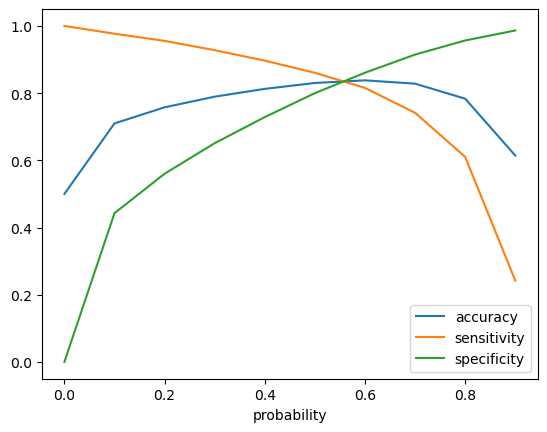

In [165]:
# Plotting accuracy, sensitivity and specificity for different probabilities.
cutoff_df.plot('probability', ['accuracy','sensitivity','specificity'])
plt.show()

### Observations:

- Accuracy - Becomes stable around 0.6

- Sensitivity - Decreases with the increased probablity.

- Specificity - Increases with the increasing probablity.

-  Therefore, At point 0.6 where the three parameters cut each other, we can see that there is a balance bethween sensitivity and specificity with a good accuracy.

Here we are intended to acheive better sensitivity than accuracy and specificity. Though as per the above curve, we should take 0.6 as the optimum probability cutoff, we are taking 0.5 for acheiving higher sensitivity, which is our main goal.

In [166]:
# Creating a column with name "predicted", which is the predicted value for 0.5 cutoff 
y_train_pred_final['predicted'] = y_train_pred_final['churn_prob'].map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,churn,churn_prob,CustID,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,predicted
0,1,0.571856,0,1,1,1,1,1,1,0,0,0,0,1
1,0,0.442678,1,1,1,1,1,1,0,0,0,0,0,0
2,0,0.000714,2,1,0,0,0,0,0,0,0,0,0,0
3,0,0.082956,3,1,0,0,0,0,0,0,0,0,0,0
4,0,0.253005,4,1,1,1,0,0,0,0,0,0,0,0


In [167]:
# Confusion metrics
confusion = metrics.confusion_matrix(y_train_pred_final['churn'], y_train_pred_final['predicted'])
print(confusion)

[[15198  3802]
 [ 2650 16350]]


In [168]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [169]:
# Accuracy
print("Accuracy on the train set:",metrics.accuracy_score(y_train_pred_final['churn'], y_train_pred_final['predicted']))

# Sensitivity
print("Sensitivity on the train set: ",TP / float(TP+FN))

# Specificity
print("Specificity on the train set:", TN / float(TN+FP))

Accuracy on the train set: 0.8302105263157895
Sensitivity on the train set:  0.8605263157894737
Specificity on the train set: 0.7998947368421052


In [170]:
# ROC Curve function

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

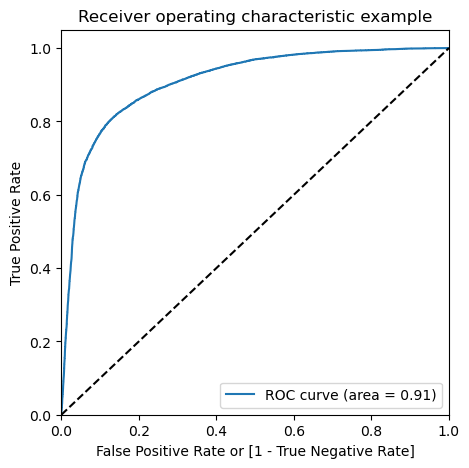

In [171]:
draw_roc(y_train_pred_final['churn'], y_train_pred_final['churn_prob'])

### Observation:

- Accuracy on the train set: 0.83
- Sensitivity on the train set:  0.85
- Specificity on the train set: 0.81
- The model performs pretty well, as we see higher sensitivity. 
- The ROC curve area is 0.91, which is good significant number closer to 1.

## Making prediction on the test set

In [172]:
#taking the test set
X_test_log_no_pca = X_test[rfe_13_cols]

#adding the constant
X_test_sm_4 = sm.add_constant(X_test_log_no_pca)

# making the prediction on the test set
y_test_pred_log_no_pca = log_no_pca_4.predict(X_test_sm_4)

In [173]:
y_test_pred_log_no_pca.head()

3470     0.253250
60147    0.000004
78466    0.002244
88353    0.810766
62032    0.614076
dtype: float64

In [174]:
# Converting y_test_pred_log_no_pca to a dataframe because it is an array
y_pred = pd.DataFrame(y_test_pred_log_no_pca)
y_pred.head()

,0
3470,0.253250
60147,0.000004
78466,0.002244
88353,0.810766
62032,0.614076


In [175]:
# Convetting y_test to a dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,churn
3470,0
60147,0
78466,0
88353,0
62032,0


In [176]:
# Putting index to Customer ID 
y_test_df['CustID'] = y_test_df.index

In [177]:
# Removing index form the both dataframes for merging them side by side
y_pred.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

y_pred.head()


,0
0,0.253250
1,0.000004
2,0.002244
3,0.810766
4,0.614076


In [178]:
# Appending y_pred and y_test_df
y_test_pred_final = pd.concat([y_test_df, y_pred], axis=1)

In [179]:
y_test_pred_final.head()

,churn,CustID,0
0,0,3470,0.253250
1,0,60147,0.000004
2,0,78466,0.002244
3,0,88353,0.810766
4,0,62032,0.614076


In [180]:
# Renaming the '0' column as churn probablity
y_test_pred_final = y_test_pred_final.rename(columns={0:'churn_prob'})

In [181]:
# Rearranging the columns
y_test_pred_final = y_test_pred_final.reindex(['CustID','churn','churn_prob'], axis=1)

In [182]:
y_test_pred_final.head()

,CustID,churn,churn_prob
0,3470,0,0.253250
1,60147,0,0.000004
2,78466,0,0.002244
3,88353,0,0.810766
4,62032,0,0.614076


In [183]:
# In the test set using probablity cutoff 0.5, what we got in the train set 
y_test_pred_final['test_predicted'] = y_test_pred_final['churn_prob'].map(lambda x: 1 if x > 0.5 else 0)

y_test_pred_final.head()

,CustID,churn,churn_prob,test_predicted
0,3470,0,0.253250,0
1,60147,0,0.000004,0
2,78466,0,0.002244,0
3,88353,0,0.810766,1
4,62032,0,0.614076,1


In [184]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test_pred_final['churn'], y_test_pred_final['test_predicted'])
print(confusion)

[[6474 1671]
 [ 155  610]]


In [185]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

# Accuracy
print("Accuracy on the test set: ",metrics.accuracy_score(y_test_pred_final['churn'], y_test_pred_final['test_predicted']))

# Sensitivity
print("Sensitivity on the test set: ",TP / float(TP+FN))

# Specificity
print("Specificity on the test set: ", TN / float(TN+FP))

Accuracy on the test set:  0.7950617283950617
Sensitivity on the test set:  0.7973856209150327
Specificity on the test set:  0.7948434622467772


## Model Summary

- The model is pretty good. 
- It is performing well on the test set based on algorithms learned from train set

Train Set :
- Accuracy on train set:  0.83
- Sensitivity on train set:  0.85
- Specificity on train set:  0.81


Test Set:
- Accuracy on Test set:  0.81
- Sensitivity on Test set:  0.81
- Specificity on Test set:  0.81

# Conclusion:

### With PCA:

Logistic Regression:
- The Accuracy and Sensitivity on train set and the test set was well maintained in Classic Logistic Regression with PCA.
- The model is pretty decent to go ahead.

Decision Tree:
- The Sensitivity has been decreased while evaluating the model on the test set.
- However, the accuracy and specificity is quite good in the test set.
    
Random Forest:
- The Accuracy has been good, but the sensitivity dropped.
- Comparately not a better model


### Without PCA:

Logistic Regression:
- The model is pretty good.
- It is performing well on the test set based on algorithms learned from train set


We can see that the logistic model with no PCA has good sensitivity and accuracy, which are comparable to the models with PCA. So, we can go for the more simplistic model such as logistic regression with PCA as it expliains the important predictor variables as well as the significance of each variable. The model also hels us to identify the variables which should be act upon for making the decision of the to be churned customers. Hence, the model is more relevant in terms of explaining to the business.

# Meeting Business Recommendations:

## Important churn indicators

In [186]:
log_no_pca_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                38000
Model:                            GLM   Df Residuals:                    37983
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15030.
Date:                Tue, 23 Jul 2024   Deviance:                       30060.
Time:                        15:10:18   Pearson chi2:                 6.57e+09
No. Iterations:                    10   Pseudo R-squ. (CS):             0.4486
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                           -0.5608      0.022    -26.026      0.000      -0.603      -0.519
offnet_mou_8                    -0.4755      0.051     -9.335      0.000      -0.575      -0.376
std_og_t2m_mou_8                 0.1956      0.045      4.311      0.000       0.107       0.284
og_others_7                     -1.1635      0.490     -2.373      0.018      -2.124      -0.203
og_others_8                     -1.0221      0.476     -2.149      0.032      -1.954      -0.090
loc_ic_t2m_mou_7                 0.9271      0.040     23.412      0.000       0.849       1.005
loc_ic_t2m_mou_8                -1.3926      0.075    -18.574      0.000      -1.540      -1.246
total_ic_mou_8                  -1.1250      0.055    -20.374      0.000      -1.233      -1.017
total_rech_num_7                 0.6072      0.027     22.363      0.000       0.554       0.660
total_rech_num_8                -1.2271      0.035    -35.305      0.000      -1.295      -1.159
last_day_rch_amt_8              -0.4811      0.022    -21.688      0.000      -0.525      -0.438
monthly_2g_7                    -0.3992      0.027    -14.647      0.000      -0.453      -0.346
monthly_2g_8                    -0.7636      0.048    -15.769      0.000      -0.859      -0.669
sachet_2g_8                     -0.3779      0.023    -16.104      0.000      -0.424      -0.332
monthly_3g_8                    -0.5649      0.028    -20.300      0.000      -0.619      -0.510
aon                             -0.3119      0.016    -19.145      0.000      -0.344      -0.280
is_decreased_rech_num_action    -0.3804      0.018    -21.029      0.000      -0.416      -0.345
================================================================================================
"""

We can see most of the top variables have negative coefficients. That means, the variables are inversely correlated with the churn probablity.

E.g.:-

If the total incomming  minutes of usage (total_ic_mou_8) is lesser in the month of August than any other month, then there is a higher chance that the customer is likely to churn.

### Business Recommendation

- Target the customers who have decreased their recharge times and amount in the action phase (August), since there are likely to be churned.
- Target the customers, whose minutes of usage of the incoming local calls and outgoing ISD calls are less in the action phase (mostly in the month of August).
- Target the customers, whose outgoing others charge in July and incoming others on August are less.
- Also, the customers having value based cost in the action phase increased are more likely to churn than the other customers. Hence, these customers may be a good target to provide offer.
- Cutomers, whose monthly 3G recharge in August is more, are likely to be churned.
- Cutomers decreasing monthly 2g usage for August are most probable to churn.
- Customers having low last recharge amount in August are more likely to churn.
- total_rech_num_7 variable and total_ic_mou_7 variable have positive coefficients 0.7901 and 0.6430 respectively. That means, customers who recharge more in july and the customers those who have high value of total incomming minutes of usage in july are likely to churn.